In [1]:
# Parameters
attr_path = "/srv/stemly/data/6/index/2/attributes/attributes.csv"
index_path = "/srv/stemly/data/6/index/2/index/index.csv"
committed_files = ["/srv/stemly/data/6/index/2/timeseries/552/commit/ts.0/9.1660802678268.parquet",
                   "/srv/stemly/data/6/index/2/timeseries/552/commit/ts.0/9.1662525119201.parquet",
                   "/srv/stemly/data/6/index/2/timeseries/552/commit/ts.0/9.1663043754388.parquet"]
predict_ts_path = "/srv/stemly/data/6/index/2/timeseries/827/staged/model/27/ts.predict.latest.parquet"
test_ts_path = "/srv/stemly/data/6/index/2/timeseries/827/staged/model/27/ts.test.latest.parquet"
validate_ts_path = "/srv/stemly/data/6/index/2/timeseries/827/staged/model/27/ts.validate.latest.parquet"
model = "custom"
model_file_id = "45"
model_resolution = None
reference_resolution = "W-MON"
project_offset = 4
project_periods = 48
project_resolution = "W-MON"
ts_train_start = "2021-08-23 00:00:00"
ts_train_v_end = "2022-06-20 00:00:00"
ts_train_t_end = "2022-06-06 00:00:00"
ts_train_p_end = "2022-07-04 00:00:00"
ts_test_start = "2022-06-06 00:00:00"
ts_test_end = "2022-06-20 00:00:00"
ts_test_duration = 2
ts_validate_start = "2022-06-20 00:00:00"
ts_validate_end = "2022-07-04 00:00:00"
ts_validate_duration = 2
ts_predict_start = "2022-07-04 00:00:00"
ts_predict_end = "2023-06-05 00:00:00"
ts_predict_duration = 48
redis_url = "redis://127.0.0.1:6300"
job_id = "72cde3c0-072a-4179-8d77-0befd9dbf644"
job_user_id = "3"
resource_id = "27"
resource_version = 1661427525800
resource_type = "modelbase"
workspace_id = "6"
job_name = "custom"
job_triggered_at = "2022-08-25 11:38:46"
job_triggered_by = "Mallikarjuna Reddy Padigapati"


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tqdm as tqdm 
import os

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 50)

In [3]:
workspace = 'w' + workspace_id
verbose = True

In [4]:
main_group_index = ['sku', 'customer', 'warehouse']
mat_group = 'sku'
freq = "MS"
load_data_from_local = False
export_data = True

In [5]:
price_index = 1103

In [6]:
if load_data_from_local :
    price_var = 'price'
    volume_var = 'dc_offtake'
    main_group_index = ['sku', 'customer', 'warehouse']
    mat_group = 'sku'
else :
    price_var = 'y'
    volume_var = 'y'
    main_group_index = ['id']
    mat_group = 'sku'
    
joining_keys = ["ts"] + main_group_index
joining_keys

['ts', 'id']

## Load data

In [7]:

ts_files = committed_files
joining_keys=["ts", "id"]
attr_cols=None

if joining_keys is None:
    joining_keys = ["ts", "id"]

at = pd.read_csv(attr_path)

idx = pd.read_csv(index_path)

# timeseries data
df = pd.concat([pd.read_parquet(fp) for fp in ts_files])
df = df.groupby(joining_keys).sum().reset_index()
df = pd.merge(df, at , left_on=["id"], right_on=["__idx"], how="left")
print(df.shape)
df.head()

(387, 14)


,ts,id,y,cases,description,level2,prod_code,prod_hierarchy,size,sku,sku_desc,sku_type,units,__idx
0,2021-08-23,1,1.0,57,FAB CLEANSER EUP 142G(50Z)X57 NONSTK,NaN,10024916,FAB,5.0,80702886,FAB PURE SKIN FACE CLEANSER 142GX57 TW [IT] [8...,Cleanser,Oz,1
1,2021-08-23,3,8.0,69,FAB ULTRAT SERUM P 50ML(1.7OZ)X3X23,Ultra Repair,10024914,FAB,1.7,82332207,FAB ULTRA HYDRATE SERUM 50MLX3X23 TW [IT] [823...,Serum,Oz,3
2,2021-08-23,4,21.0,42,FAB ULTRAR MASK 56.7G(2.0OZ)X42 NONSTK,Ultra Repair,9222618,FAB,2.0,82332208,FAB ULTRA REPAIR OAT MASK 56.7GX42 [IT] [82332...,Cream,Oz,4
3,2021-08-23,5,8.0,48,FAB ULTRAR TONER P 177ML(60Z)X6X8 NONSTK,Ultra Repair,10024913,FAB,6.0,82332219,FAB ULTRA OAT SOOTHING TNR 177MLX6X8 TW [IT] [...,Toner,Oz,5
4,2021-08-23,6,6.0,48,FAB ULTRAR TONER P 177ML(6OZ)X6X8 NONSTK,Ultra Repair,10080881,FAB,6.0,82332800,FAB FACIAL RAD PAD 60CTX3X12 TW [IT] [82332800...,Toner,Oz,6


In [8]:

df = df.loc[~df.id.isin([2])] # drop 2

# df["year"] = df.ts.dt.year
df["month"] = df.ts.dt.month
df["woy"] = df.ts.dt.isocalendar().week
df["woy"] = df["woy"].astype(int)

df.dropna(subset=["y"], inplace=True)
df.reset_index(drop=True, inplace=True)

## Helper

In [9]:
from sklearn.metrics import r2_score, mean_squared_error

def r2_rmse(g, actual="y", prediction="yhat"):
    r2 = r2_score( g[actual], g[prediction] )
    rmse = np.sqrt( mean_squared_error( g[actual], g[prediction] ) )
    actuals = g[actual].sum()
    predicted = g[prediction].sum()
    return pd.Series( dict(  actuals = actuals,prediction = predicted,r2 = r2, rmse = rmse) )

def mape(actual, pred): 
    actual, pred = np.array(actual), np.array(pred)
    return np.mean(np.abs((actual - pred) / actual)) * 100

def mean_absolute_percentage_error(g, actual='y', prediction='yhat'): 
    y_true, y_pred = np.array(g[actual]), np.array(g[prediction])
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def mase(g, actual='y', prediction='yhat'):
    """
    Computes the MEAN-ABSOLUTE SCALED ERROR forcast error for univariate time series prediction.
    
    See "Another look at measures of forecast accuracy", Rob J Hyndman
    
    parameters:
        training_series: the series used to train the model, 1d numpy array
        testing_series: the test series to predict, 1d numpy array or float
        prediction_series: the prediction of testing_series, 1d numpy array (same size as testing_series) or float
        absolute: "squares" to use sum of squares and root the result, "absolute" to use absolute values.
    
    """
    n = g.shape[0]
    d = np.abs(  np.diff( training_series) ).sum()/(n-1)
    
    errors = np.abs(testing_series - prediction_series )
    return errors.mean()/d

def ape(g, actual='y', prediction='yhat'):
    ape_vals = abs(g[actual] - g[prediction]) / g[actual]
    ape_vals = ape_vals*100
    ape_vals = ape_vals.round(2)  
    return ape_vals

def extract_sliding(df, window=8, gap=4, target="y"):
    lags = [x for x in range(gap + 1, gap + window + 1)]
    aa = df[["id", "ts", "y"]].assign(**{
        "{}_lag_{}".format(col, l): df.groupby(["id"], observed=True)[col].transform(lambda x: x.shift(l))
        for l in lags
        for col in [target]
    })
    aa.sort_values(by=["id", "ts"], inplace=True)
    aa.reset_index(inplace=True)
    aa.rename(columns={"index": "sub_id"}, inplace=True)

    b = aa.drop(columns=["id", "ts", "y"]).melt(
        id_vars="sub_id",
        value_name="y",
        var_name="lags"
    )
    b["lags"] = [int(x.replace("y_lag_", "")) for x in b["lags"]]
    return aa, b

def calc_metrics(y, yhat):
    """
    Calculate metrics for a single series.
    """
    # mae
    mae = np.mean(np.abs(y - yhat))

    # smape
    smape = 2 * np.abs((y - yhat) / (y + yhat))
    smape = np.nan_to_num(smape, 0)
    smape = np.mean(smape)

    # mape
    mape = np.abs((y - yhat) / y)
    mape = np.nan_to_num(mape, 0)
    mape = np.mean(mape)

    # maape
    maape = np.arctan2(np.abs(y - yhat), np.abs(y))
    maape = np.mean(maape)

    # rmse
    rmse = (y - yhat) * (y - yhat)
    rmse = np.sqrt(np.mean(rmse))

    return {
        "rmse": rmse,
        "mae": mae,
        "smape": smape,
        "mape": mape,
        "maape": maape
    }

## Data

### Processed

In [10]:
freq = "W-Mon"

In [11]:
df.head()

,ts,id,y,cases,description,level2,prod_code,prod_hierarchy,size,sku,sku_desc,sku_type,units,__idx,month,woy
0,2021-08-23,1,1.0,57,FAB CLEANSER EUP 142G(50Z)X57 NONSTK,NaN,10024916,FAB,5.0,80702886,FAB PURE SKIN FACE CLEANSER 142GX57 TW [IT] [8...,Cleanser,Oz,1,8,34
1,2021-08-23,3,8.0,69,FAB ULTRAT SERUM P 50ML(1.7OZ)X3X23,Ultra Repair,10024914,FAB,1.7,82332207,FAB ULTRA HYDRATE SERUM 50MLX3X23 TW [IT] [823...,Serum,Oz,3,8,34
2,2021-08-23,4,21.0,42,FAB ULTRAR MASK 56.7G(2.0OZ)X42 NONSTK,Ultra Repair,9222618,FAB,2.0,82332208,FAB ULTRA REPAIR OAT MASK 56.7GX42 [IT] [82332...,Cream,Oz,4,8,34
3,2021-08-23,5,8.0,48,FAB ULTRAR TONER P 177ML(60Z)X6X8 NONSTK,Ultra Repair,10024913,FAB,6.0,82332219,FAB ULTRA OAT SOOTHING TNR 177MLX6X8 TW [IT] [...,Toner,Oz,5,8,34
4,2021-08-23,6,6.0,48,FAB ULTRAR TONER P 177ML(6OZ)X6X8 NONSTK,Ultra Repair,10080881,FAB,6.0,82332800,FAB FACIAL RAD PAD 60CTX3X12 TW [IT] [82332800...,Toner,Oz,6,8,34


In [12]:
from dateutil.relativedelta import relativedelta
def generate_dates_new(
        last_test_date="2021-12-27",
        gap_in_days=28,
        test_horizon_in_days=28,
        version_skip = 28,
        fc_horizon_in_days=84,
        freq="W-Mon",
        n_rounds=2
):
    ts_test_end = pd.to_datetime(last_test_date) 
    ts_test_start = ts_test_end - pd.Timedelta(days=test_horizon_in_days - 1)
   
    ts_predict_start = ts_test_end + pd.Timedelta(days=1)
    ts_predict_end = ts_predict_start + pd.Timedelta(days=fc_horizon_in_days-1)

   
    test_dates = pd.date_range(
        start=ts_test_start,
        end=ts_test_end,
        freq=freq,
    )
    forecast_dates = pd.date_range(
        start=ts_predict_start,
        end=ts_predict_end,
        freq=freq,
    )
    all_dates1 = df.ts.unique()
    train_dates = all_dates1[all_dates1 < np.min(test_dates)]
    a = test_dates[0].month
    all_dates_new = {
        a: {
            
            "train" : pd.to_datetime(train_dates),
            "test": test_dates,
            "forecast": forecast_dates,
        },
    }
    for k in range(n_rounds):
        a = a - 1
        if a == 0:
            a = 12
        train_dates = pd.date_range(
            start=pd.to_datetime(train_dates[0]),
            end=pd.to_datetime(train_dates[-1]) - relativedelta(days=gap_in_days),
            freq=freq
        )
        test_dates = pd.date_range(
            start=test_dates[0]- relativedelta(days=gap_in_days),
            end=test_dates[-1] - relativedelta(days=gap_in_days),
            freq=freq
        )
        forecast_dates = pd.date_range(
            start=forecast_dates[0]- relativedelta(days=gap_in_days),
            end=forecast_dates[-1] - relativedelta(days=gap_in_days),
            freq=freq
        )
        all_dates_new.update({
            a: {
                "train" : train_dates,
                "test": test_dates,
                "forecast": forecast_dates,
            }
        })
    return all_dates_new


In [13]:
ts_test_end = "2022-08-28 00:00:00"
all_dates = generate_dates_new(
#     last_test_date="2021-12-27",
    last_test_date= ts_test_end,
    freq=freq,
    gap_in_days=28,
    version_skip = 1,
    fc_horizon_in_days = 367,
    test_horizon_in_days=28,
    n_rounds=2
)
all_dates

versions = []
for i in all_dates.keys():
    versions.append(i)
m=list(all_dates.keys())[0]
    
versions ,all_dates 

([8, 7, 6],
 {8: {'train': DatetimeIndex(['2021-08-23', '2021-08-30', '2021-09-06', '2021-09-13',
                  '2021-09-20', '2021-09-27', '2021-10-04', '2021-10-11',
                  '2021-10-18', '2021-10-25', '2021-11-01', '2021-11-08',
                  '2021-11-15', '2021-11-22', '2021-11-29', '2021-12-06',
                  '2021-12-13', '2021-12-20', '2021-12-27', '2022-01-03',
                  '2022-01-10', '2022-01-17', '2022-01-24', '2022-01-31',
                  '2022-02-07', '2022-02-14', '2022-02-21', '2022-02-28',
                  '2022-03-07', '2022-03-14', '2022-03-21', '2022-03-28',
                  '2022-04-04', '2022-04-11', '2022-04-18', '2022-04-25',
                  '2022-05-02', '2022-05-09', '2022-05-16', '2022-05-23',
                  '2022-05-30', '2022-06-06', '2022-06-13', '2022-06-20',
                  '2022-06-27', '2022-07-04', '2022-07-11', '2022-07-18',
                  '2022-07-25'],
                 dtype='datetime64[ns]', freq=None),
  

In [14]:
ts = df[['ts','id','y']]
ts = ts.set_index("ts").groupby('id').resample('MS',label='left',closed = 'left').sum().drop(columns={'id'}).reset_index()
ts

,id,ts,y
0,0,2021-10-01,619.0
1,0,2021-11-01,2220.0
2,0,2021-12-01,310.0
3,0,2022-01-01,723.0
4,0,2022-02-01,610.0
...,...,...,...
84,7,2022-04-01,235.0
85,7,2022-05-01,2220.0
86,7,2022-06-01,4803.0
87,7,2022-07-01,2221.0


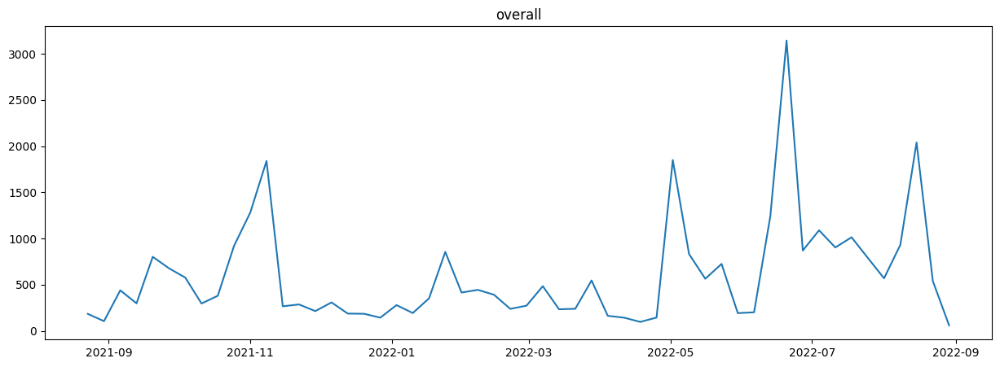

In [15]:
main_ts = df[['ts','id','y']]
#main_ts = main_ts.set_index("ts").groupby('id').resample('MS',label='left',closed = 'left').sum().drop(columns={'id'}).reset_index()
ts = main_ts.groupby("ts").sum()
plt.figure(figsize=(15,5))
plt.plot(ts.y)
plt.title('overall')
plt.show()

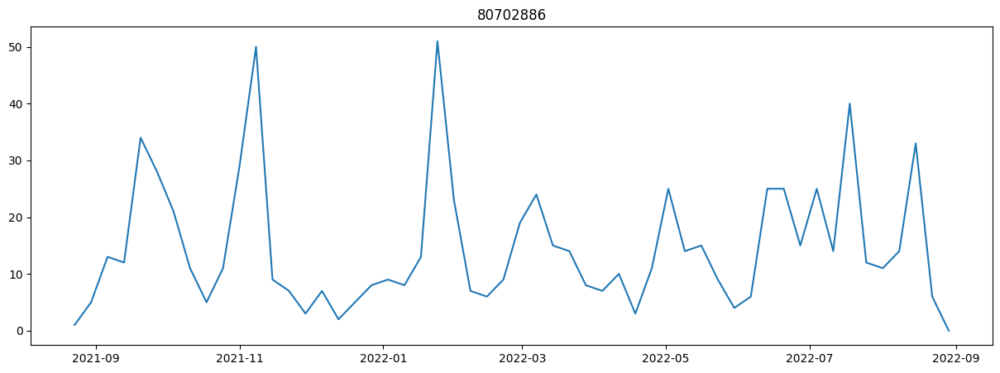

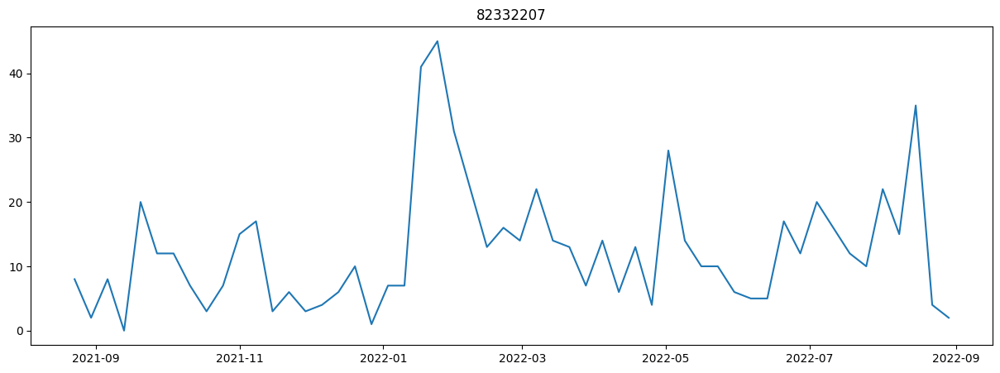

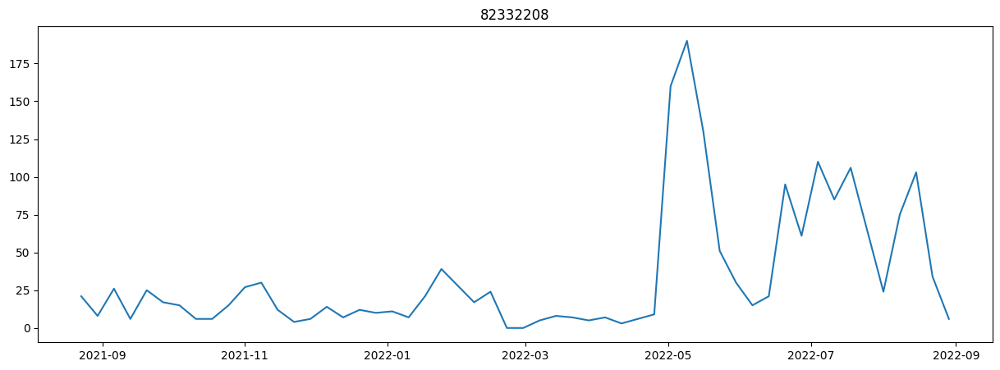

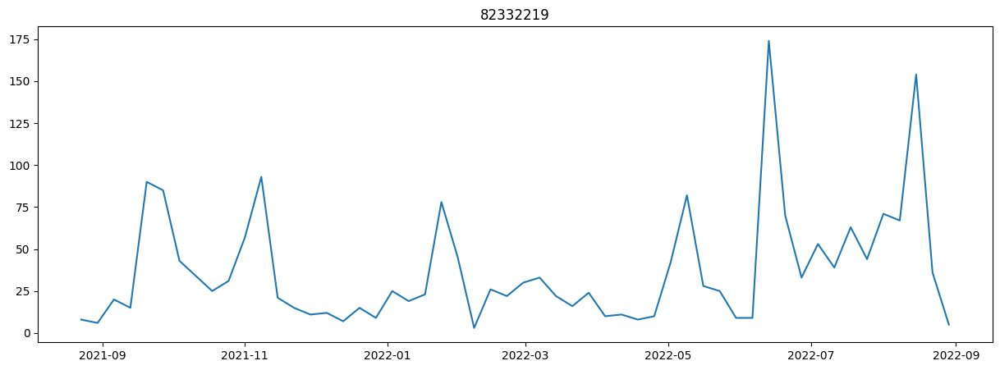

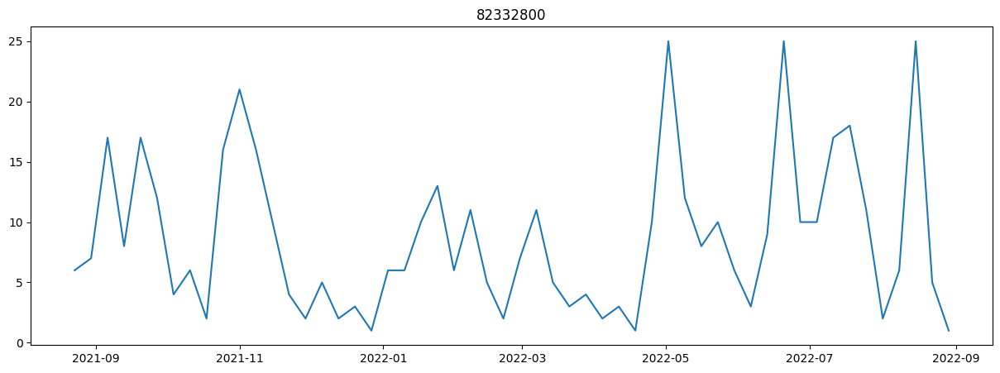

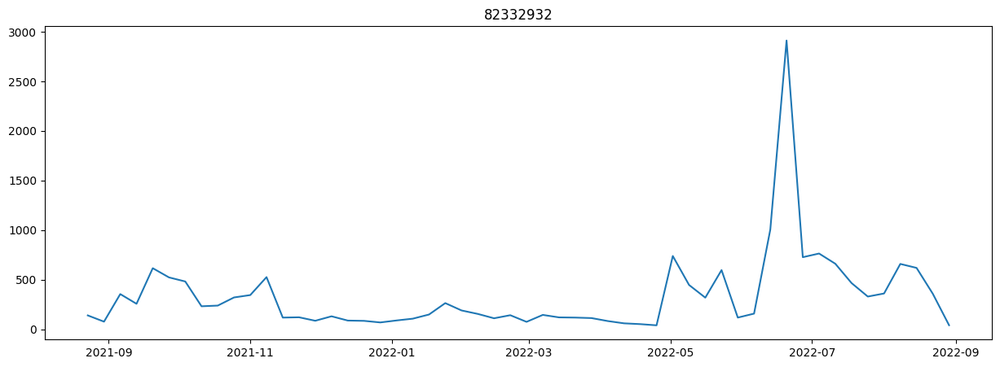

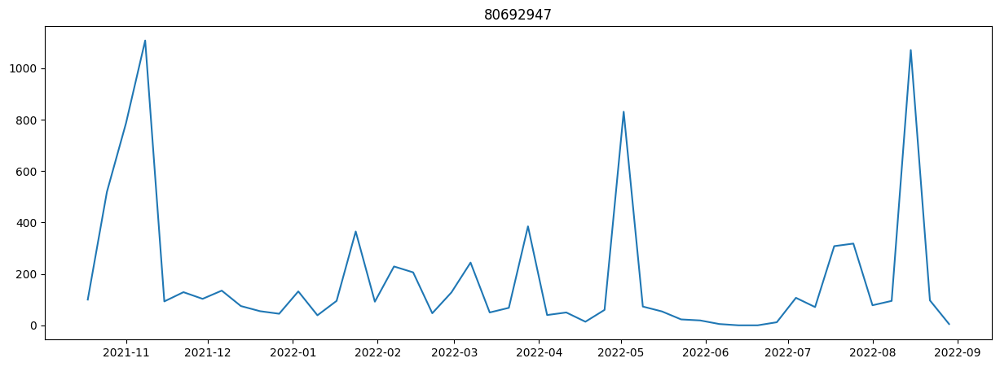

In [16]:
for a in df.sku.unique():
    ts = df.loc[df.sku == a].groupby("ts").sum()
    plt.figure(figsize=(15,5))
    plt.plot(ts.y)
    plt.title(a)
    plt.show()

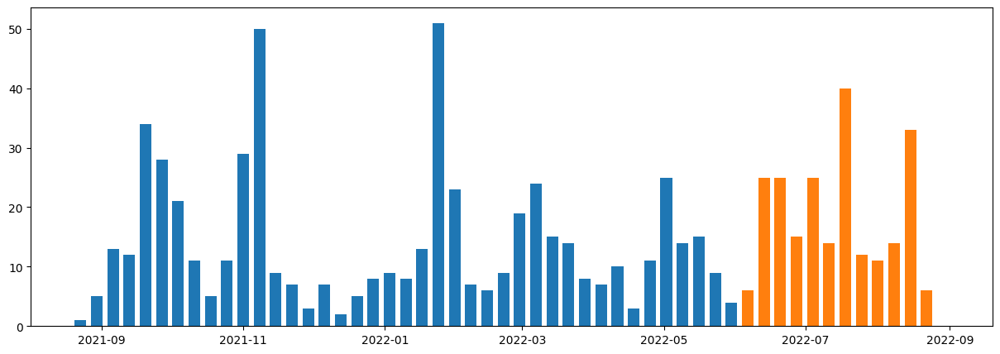

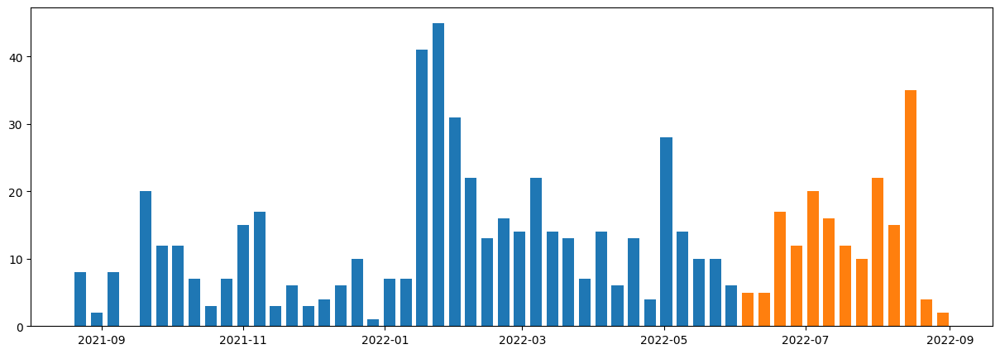

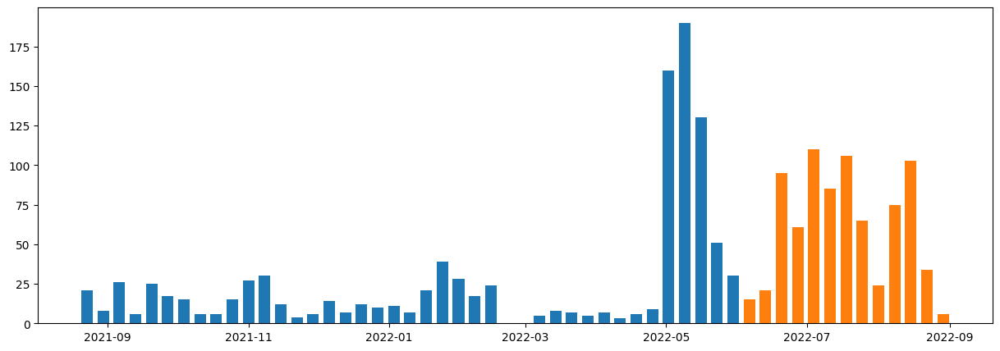

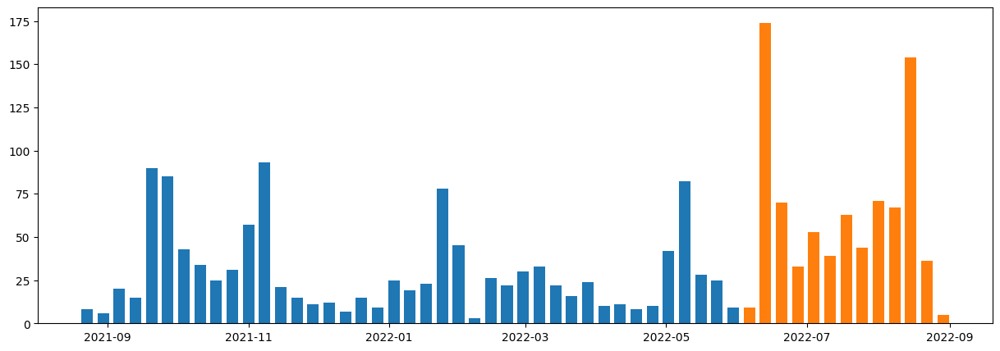

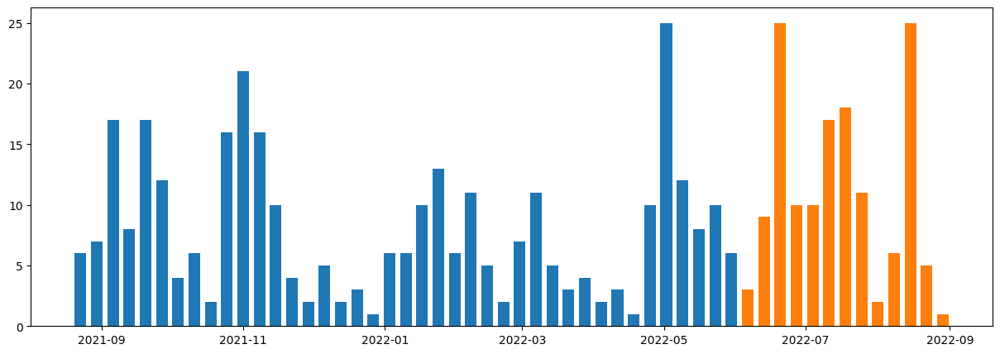

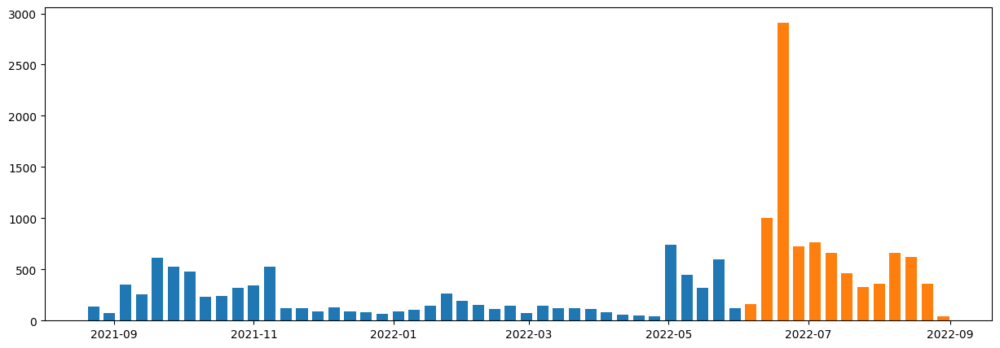

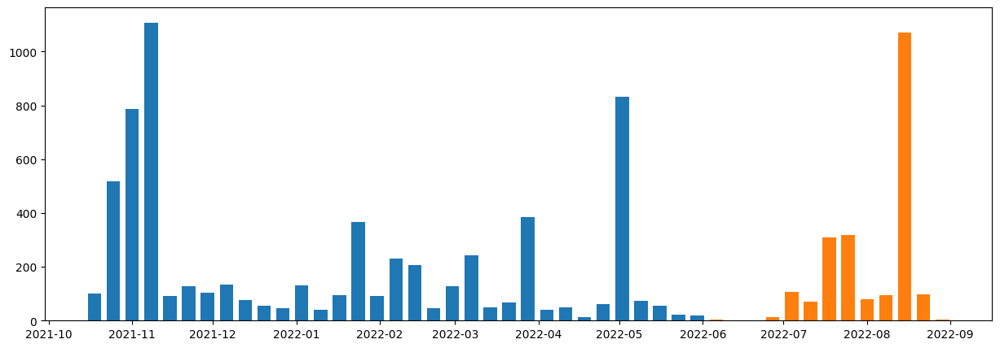

In [17]:
for a in df.sku.unique():
    ts = df.loc[df.sku == a].groupby("ts").sum()
    a = ts.loc[ts.index < "2022-06-01"]
    b = ts.loc[ts.index >= "2022-06-01"]
    plt.figure(figsize=(15,5))
    plt.bar(a.index, a.y, width=5)
    plt.bar(b.index, b.y, width=5)
    plt.show()

### Differenced

In [18]:
df_diff = []
all_ids = df.id.unique()
initial = []
for i in range(len(all_ids)):
    id_ = all_ids[i]
    tmp = df.loc[df.id == id_].reset_index(drop=True)
    tmp2 = tmp.copy()
    initial.append(tmp["y"][0])
    
    tmp2["y"] = tmp["y"].diff()
    #tmp2["y"].fillna(tmp["y"], inplace=True)
    tmp2.dropna(subset="y", inplace=True)
    df_diff.append(tmp2)
initial_y = pd.DataFrame({"id": all_ids, "initial": initial})
initial_y.set_index("id", inplace=True)
df_diff = pd.concat(df_diff).reset_index(drop=True)

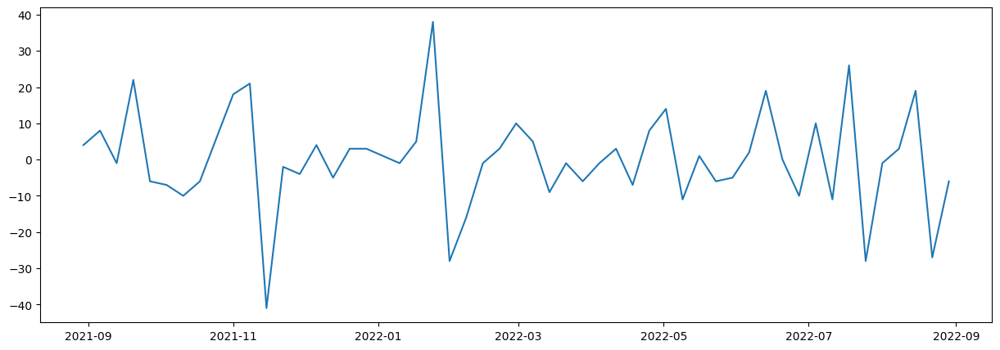

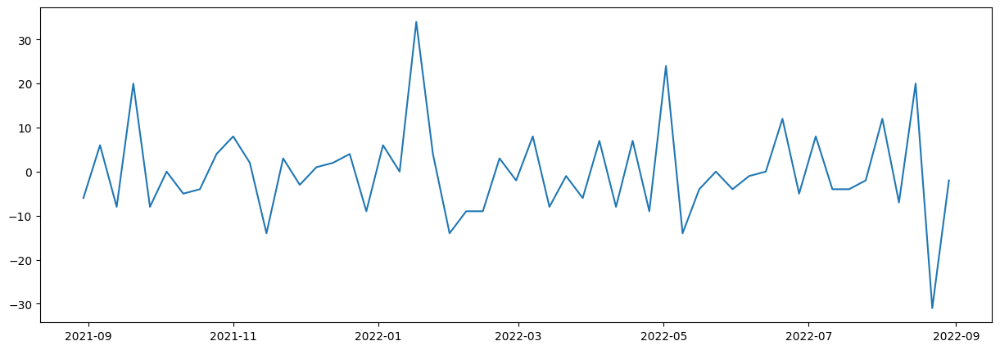

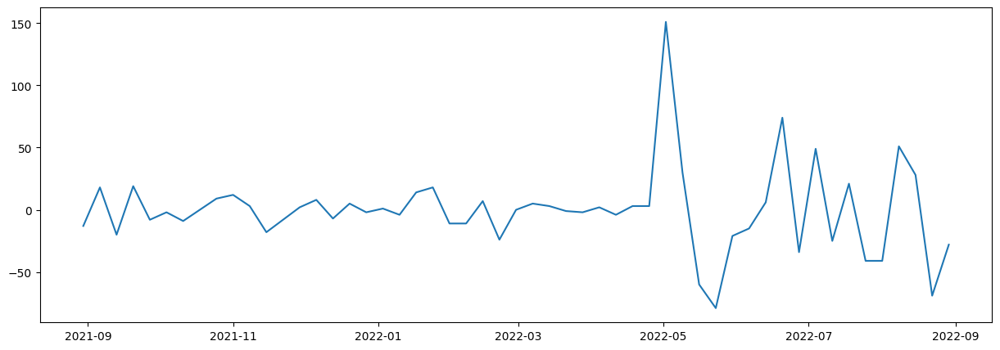

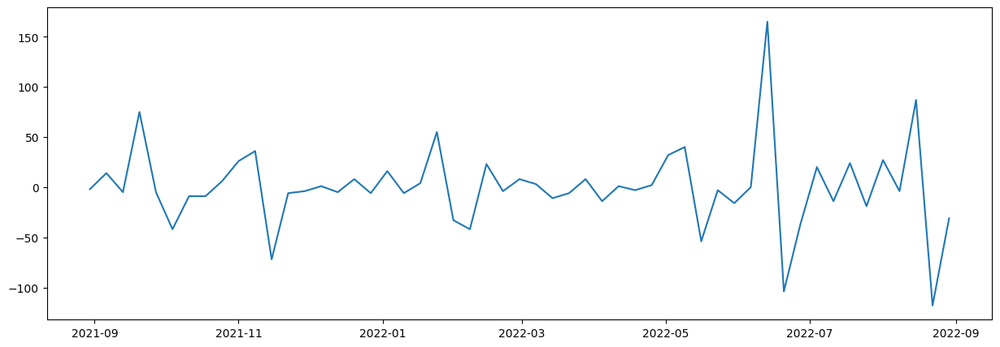

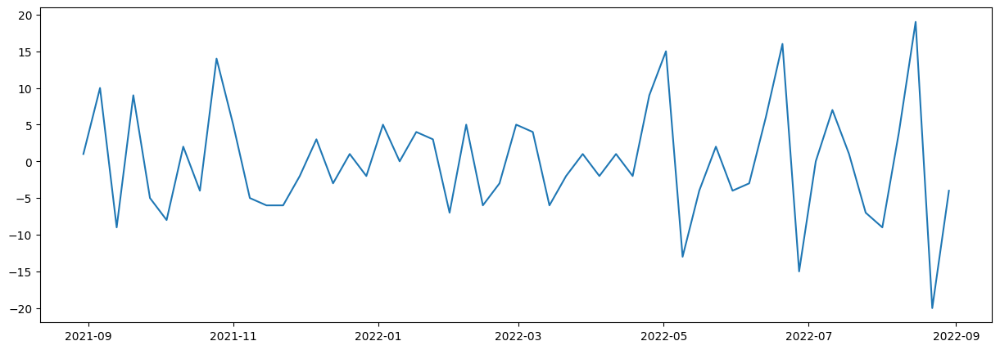

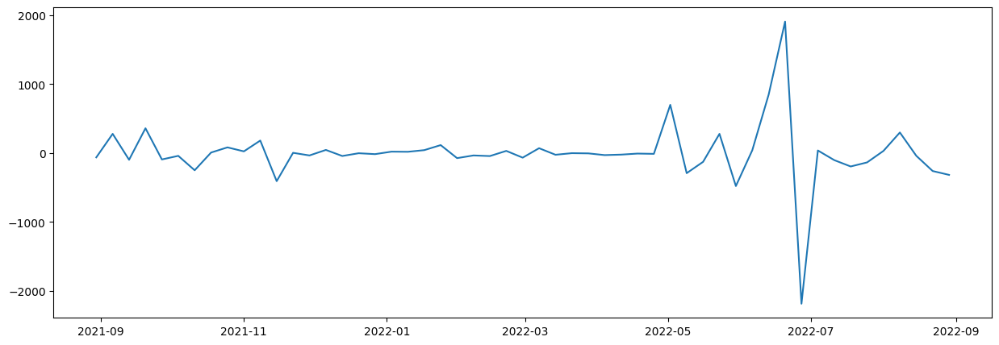

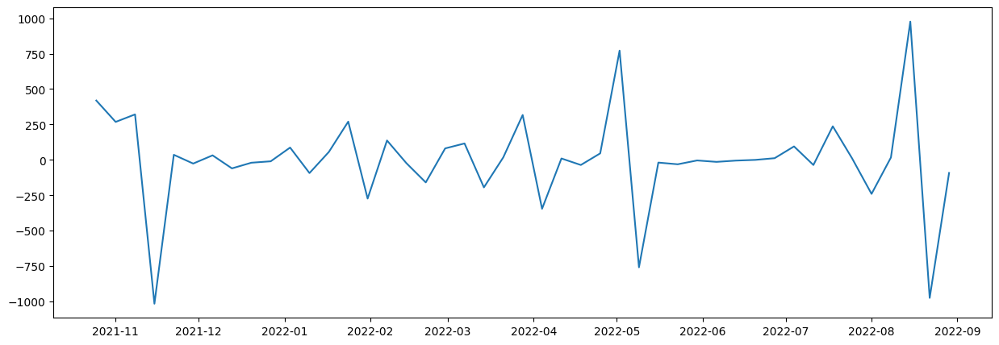

In [19]:
for a in df_diff.id.unique():
    ts = df_diff.loc[df_diff.id == a].groupby("ts").sum()
    plt.figure(figsize=(15,5))
    plt.plot(ts.y)
    plt.show()

### Attributes

In [20]:
df.head()

,ts,id,y,cases,description,level2,prod_code,prod_hierarchy,size,sku,sku_desc,sku_type,units,__idx,month,woy
0,2021-08-23,1,1.0,57,FAB CLEANSER EUP 142G(50Z)X57 NONSTK,NaN,10024916,FAB,5.0,80702886,FAB PURE SKIN FACE CLEANSER 142GX57 TW [IT] [8...,Cleanser,Oz,1,8,34
1,2021-08-23,3,8.0,69,FAB ULTRAT SERUM P 50ML(1.7OZ)X3X23,Ultra Repair,10024914,FAB,1.7,82332207,FAB ULTRA HYDRATE SERUM 50MLX3X23 TW [IT] [823...,Serum,Oz,3,8,34
2,2021-08-23,4,21.0,42,FAB ULTRAR MASK 56.7G(2.0OZ)X42 NONSTK,Ultra Repair,9222618,FAB,2.0,82332208,FAB ULTRA REPAIR OAT MASK 56.7GX42 [IT] [82332...,Cream,Oz,4,8,34
3,2021-08-23,5,8.0,48,FAB ULTRAR TONER P 177ML(60Z)X6X8 NONSTK,Ultra Repair,10024913,FAB,6.0,82332219,FAB ULTRA OAT SOOTHING TNR 177MLX6X8 TW [IT] [...,Toner,Oz,5,8,34
4,2021-08-23,6,6.0,48,FAB ULTRAR TONER P 177ML(6OZ)X6X8 NONSTK,Ultra Repair,10080881,FAB,6.0,82332800,FAB FACIAL RAD PAD 60CTX3X12 TW [IT] [82332800...,Toner,Oz,6,8,34


In [21]:
att_cols = ["id", "sku_desc", "sku", "prod_hierarchy", "prod_code", "description", "sku_type", "size", "units", "cases", "level2"]
att = df[att_cols].drop_duplicates()
att.reset_index(inplace=True, drop=True)
print("Att", att.shape)

Att (7, 11)


## Dates

## HW-ETS

In [22]:
from statsmodels.tsa.exponential_smoothing.ets import ETSModel

In [23]:
df.shape[0]

370

In [24]:
def ets_forecast(
    series,
    train_dates,
    test_dates,
):    
    if len(series) > 0:
        # time series must not be empty!

        # fit parameters on val
        train = series.loc[series.index.isin(train_dates)]
        test = series.loc[series.index.isin(test_dates)]

        if np.sum(train) == 0:
            # special case when all the values are 0
            out = np.zeros(len(train)+len(test))
            
            return out

        # do cross validation
        configs = [True, False]
        error = ["add"]
        trend = ["add"]
        damped_trend = [True, False]
        seasonal = [None, "add"]
        seasonal_periods = [4,6,12]
        best_config = None
        best_metric = np.inf
        best_quantile = None
        best_model = None
        for q in [0.95, 0.96, 0.97, 0.98, 0.99]:
            for e in error:
                for t in trend:
                    for d in damped_trend:
                        for s in seasonal:
                            if s is None:
                                model = ETSModel(
                                    np.clip(train, 0, np.quantile(train[np.where(train > 0)[0][0]:], q)),
                                    error=e,
                                    trend=t,
                                    seasonal=s,
                                    damped_trend=d,
                                    seasonal_periods=None,
                                ).fit()
                                
                                yhat = model.predict(0, len(train) - 1)
                                yhat = np.array(yhat)
                                yhat = np.clip(yhat, 0, None)
                                
                                rmse = (train.values - yhat) * (train.values - yhat)
                                rmse = np.sqrt(np.mean(rmse))

                                if rmse < best_metric:
                                    best_metric = rmse
                                    best_model = model
                            else:
                                for ss in seasonal_periods:
                                    model = ETSModel(
                                        np.clip(train, 0, np.quantile(train[np.where(train > 0)[0][0]:], q)),
                                        error=e,
                                        trend=t,
                                        seasonal=s,
                                        damped_trend=d,
                                        seasonal_periods=ss,
                                    ).fit()

                                    yhat = model.predict(0, len(train) - 1)
                                    yhat = np.array(yhat)
                                    yhat = np.clip(yhat, 0, None)

                                    rmse = (train.values - yhat) * (train.values - yhat)
                                    rmse = np.sqrt(np.mean(rmse))

                                    if rmse < best_metric:
                                        best_metric = rmse
                                        best_model = model

        # do forecast on train
        yhat_train = best_model.predict(0, len(train) - 1)
        yhat_train = np.array(yhat_train)
        yhat_train = np.clip(yhat_train, 0, None)
        
        # first forecast on test to get a sense of how well the model performs
        yhat_test = best_model.forecast(len(test))
        yhat_test = np.array(yhat_test)
        yhat_test = np.clip(yhat_test, 0, None)
        
        # concatenate all predictions
        out = np.concatenate((yhat_train, yhat_test))

        return out

    return None

In [25]:
def forecast_ets(
    data,
    dates,
    num_cores=-1,
    freq="MS",
):
    import multiprocessing
    from pandarallel import pandarallel
    
    import warnings
    import logging
    from statsmodels.tools.sm_exceptions import ConvergenceWarning
    
    np.seterr(divide='ignore', invalid='ignore')
    warnings.simplefilter('ignore', ConvergenceWarning)
    logging.getLogger('prophet').setLevel(logging.ERROR)
    
    if num_cores < 0:
        num_cores = multiprocessing.cpu_count()
    else:
        num_cores = min(num_cores, multiprocessing.cpu_count())
        
    pandarallel.initialize(
        nb_workers=num_cores,
        verbose=0,
        progress_bar=True
    )
    
    train_dates = dates["train"]
    test_dates = dates["test"]
    
    s = data.set_index(["id", "ts"], drop=True)["y"]
    s = s.unstack(0).fillna(0)
    s = s.asfreq(freq)
    
    print(train_dates)
    print(test_dates)
    yhat = s.parallel_apply(lambda x: ets_forecast(
        x,
        train_dates,
        test_dates,
    ), axis=0)
    
    

    yhat = yhat.reset_index(drop=True).apply(lambda x: pd.Series(x.dropna().values)).dropna()

    yhat["ts"] = pd.date_range(
        start=max(np.min(train_dates), data.ts.min()),
        end=np.max(test_dates),
        freq=freq
    )
    
    yhat = pd.melt(yhat, id_vars=['ts'], var_name="id", value_name="yhat")
    yhat = pd.merge(df, yhat, on=["ts", "id"], how="left")
    
    yhat = yhat[["id", "ts", "y", "yhat"]+[x for x in yhat.columns if x not in ["id", "ts", "y", "yhat"]]]
          
    return yhat.reset_index(drop=True)

In [26]:
pred_hws = {}
for i in range(len(versions)):
    pred_hw = forecast_ets(
        df,
        all_dates[versions[i]],
        num_cores=-1,
        freq=freq,
    )
    pred_hws.update({versions[i]: pred_hw})

DatetimeIndex(['2021-08-23', '2021-08-30', '2021-09-06', '2021-09-13',
               '2021-09-20', '2021-09-27', '2021-10-04', '2021-10-11',
               '2021-10-18', '2021-10-25', '2021-11-01', '2021-11-08',
               '2021-11-15', '2021-11-22', '2021-11-29', '2021-12-06',
               '2021-12-13', '2021-12-20', '2021-12-27', '2022-01-03',
               '2022-01-10', '2022-01-17', '2022-01-24', '2022-01-31',
               '2022-02-07', '2022-02-14', '2022-02-21', '2022-02-28',
               '2022-03-07', '2022-03-14', '2022-03-21', '2022-03-28',
               '2022-04-04', '2022-04-11', '2022-04-18', '2022-04-25',
               '2022-05-02', '2022-05-09', '2022-05-16', '2022-05-23',
               '2022-05-30', '2022-06-06', '2022-06-13', '2022-06-20',
               '2022-06-27', '2022-07-04', '2022-07-11', '2022-07-18',
               '2022-07-25'],
              dtype='datetime64[ns]', freq=None)
DatetimeIndex(['2022-08-01', '2022-08-08', '2022-08-15', '2022-08-22'

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f=  6.83929D+00    |proj g|=  8.99900D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f=  4.82168D+00    |proj g|=  8.99900D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f=  3.13389D+00    |proj g|=  3.47015D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f=  6.84118D+00    |proj g|=  8.99900D-01

At iterate    1    f=  3.12863D+00    |proj g|=  1.38586D-01

At iterate    1    f=

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f=  6.85972D+00    |proj g|=  8.99900D-01

At iterate    1    f=  6.84971D+00    |proj g|=  2.44296D-01

At iterate    2    f=  6.77872D+00    |proj g|=  1.30788D-01
RUNNING THE L-BFGS-B CODE

At iterate    3    f=  6.77046D+00    |proj g|=  7.67194D-02

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f=  3.69234D+00    |proj g|=  1.80000D-01

At iterate    4    f=  6.76895D+00    |proj g|=  5.30806D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


At X0         1 variables are exactly at the bounds
At iterate    5    f=  6.76819D+00    |proj g|=  1.88316D-02

At iterate    0    f=  3.51445D+00    |proj g|=  1.80000D-01


A

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f=  6.90383D+00    |proj g|=  8.99900D-01

At iterate    1    f=  6.88901D+00    |proj g|=  2.02612D-01

At iterate    2    f=  6.81831D+00    |proj g|=  1.17586D-01

At iterate    3    f=  6.81520D+00    |proj g|=  1.30560D-01
  ys=-1.682E-04  -gs= 3.026E-03 BFGS update SKIPPED

At iterate    4    f=  6.81394D+00    |proj g|=  1.07461D-01

At iterate    5    f=  6.81139D+00    |proj g|=  5.29959D-02
RUNNING THE L-BFGS-B CODE

At iterate    6    f=  6.80648D+00    |proj g|=  1.03899D-01

At iterate    7    f=  6.79990D+00    |proj g|=  8.00799D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f=  3.54500D+00    |proj g|=  1.80000D-01

RUNNING THE L-BFGS-B CODE

  

In [27]:
yhat_hws = {}
for i in range(len(versions)):
    yhat_hw = pred_hws[versions[i]]
    yhat_hws.update({versions[i]: yhat_hw})

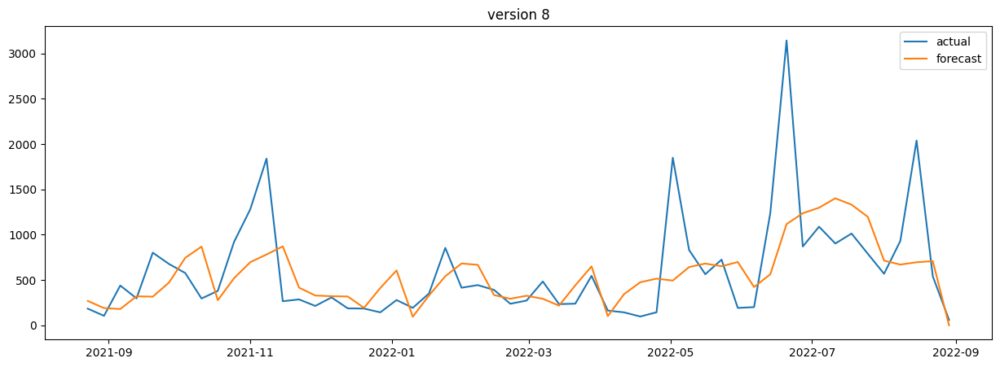

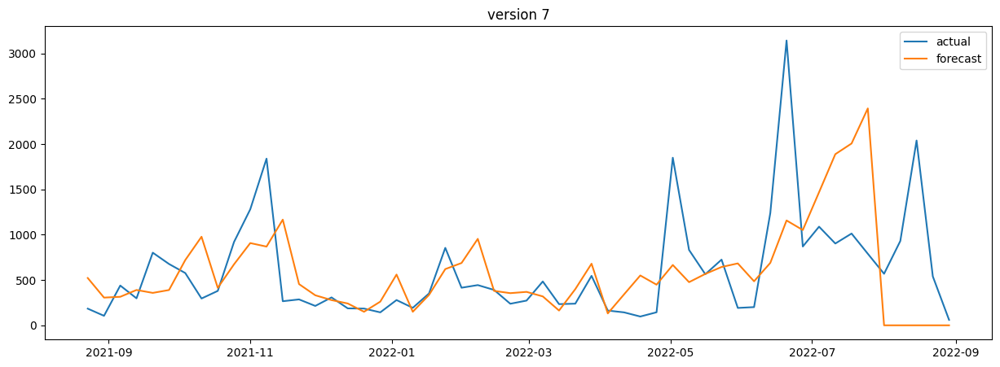

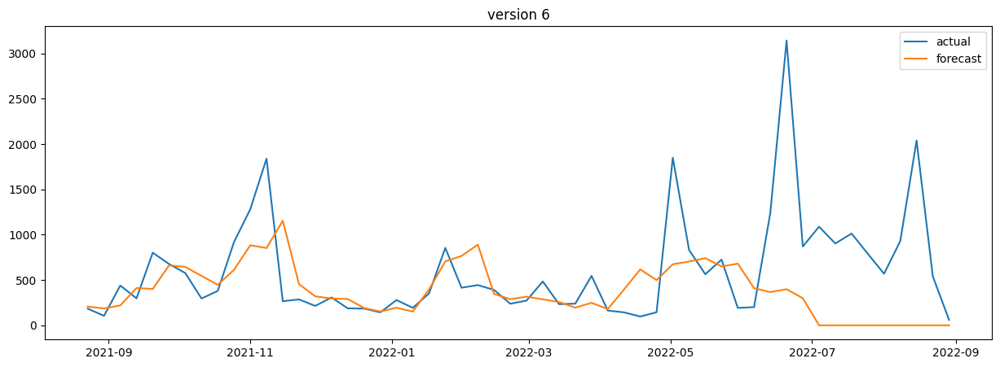

In [28]:
for i in range(len(versions)):
    yhat_hw = yhat_hws[versions[i]]
    ts = yhat_hw.groupby("ts")[["y", "yhat"]].sum()
    plt.figure(figsize=(15,5))
    plt.plot(ts.y, label="actual")
    plt.plot(ts.yhat, label="forecast")
    plt.title("version {}".format(versions[i]))
    plt.legend()
    plt.show()

In [29]:
df.ts.min()

Timestamp('2021-08-23 00:00:00')

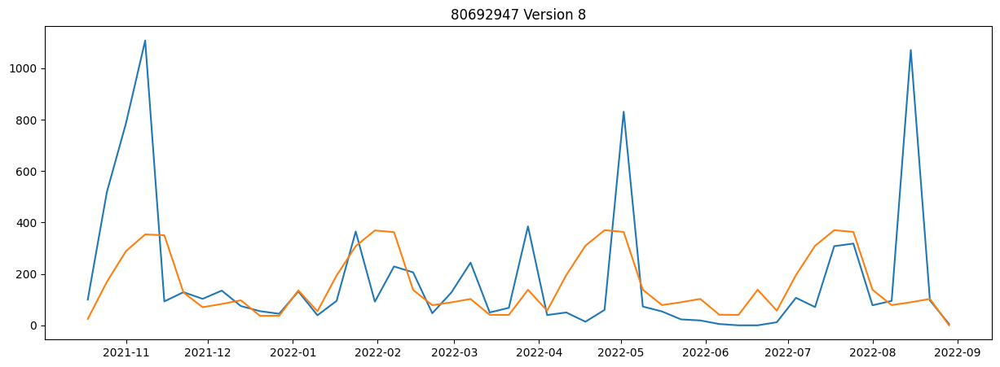

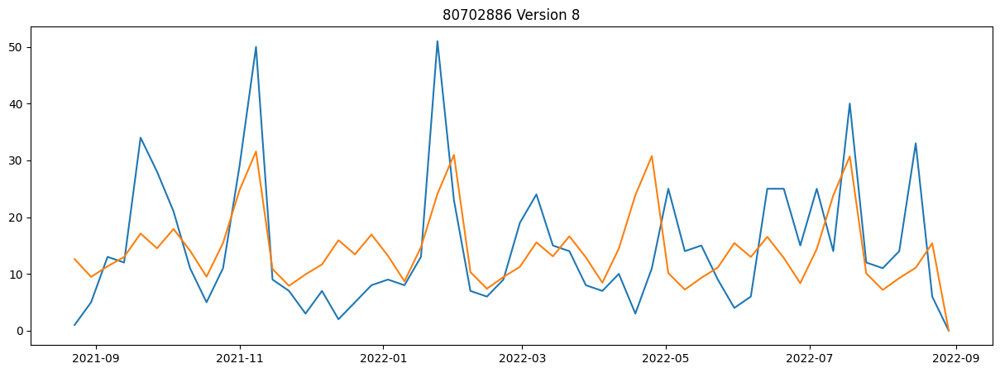

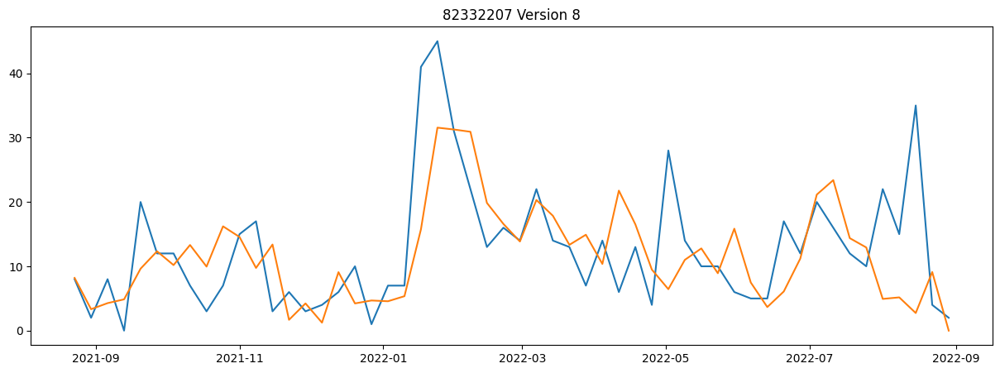

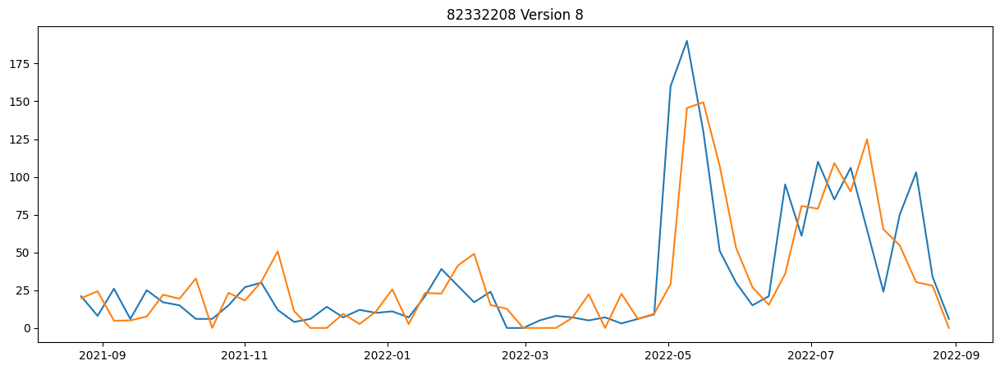

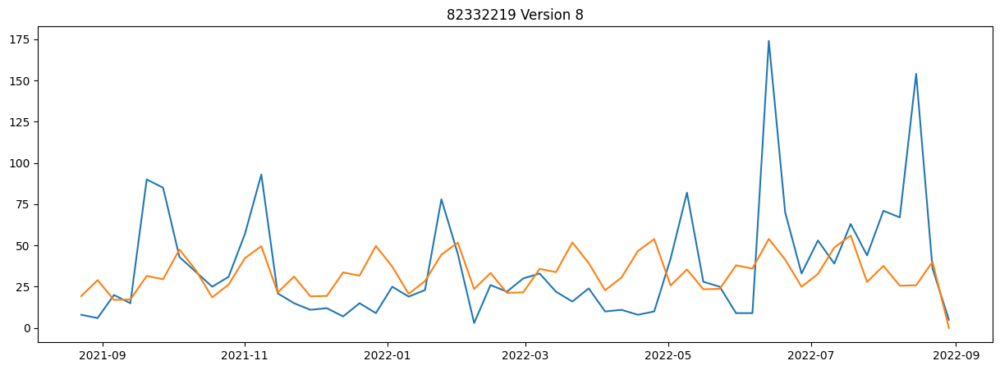

...

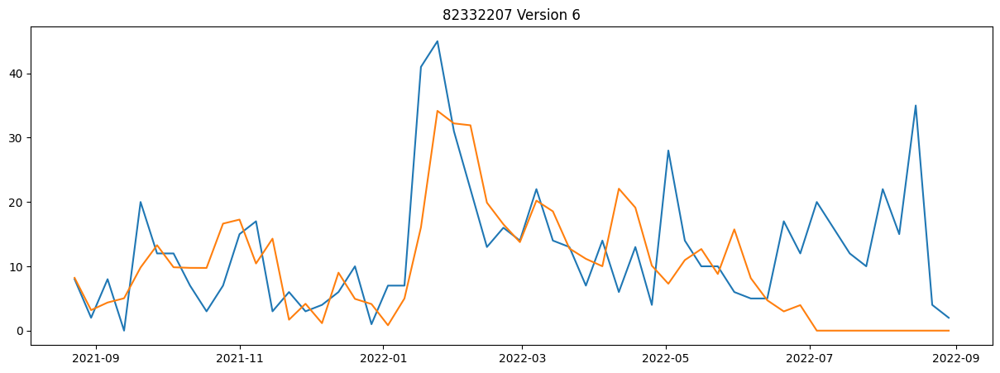

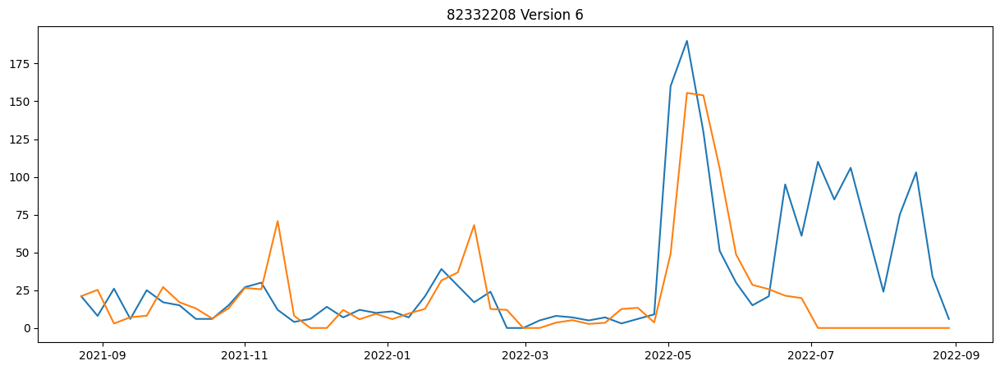

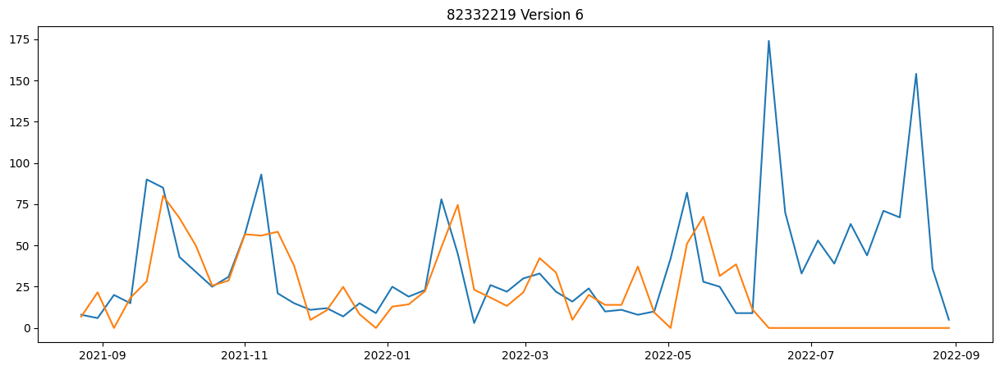

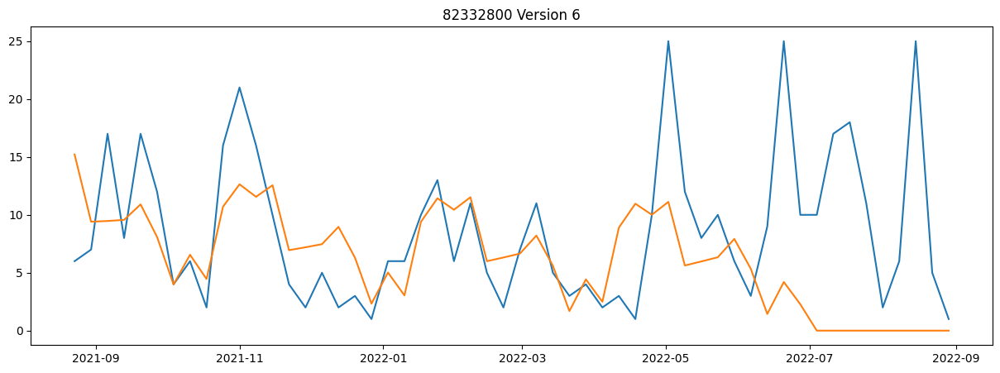

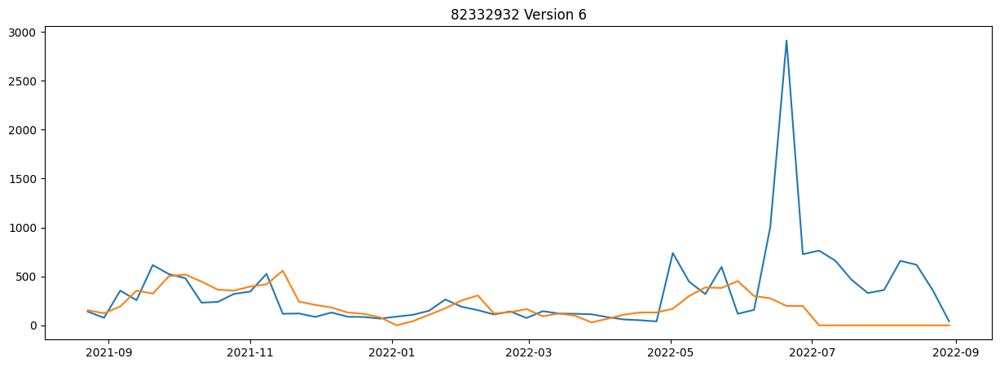

In [30]:
for i in range(len(versions)):
    yhat_hw = yhat_hws[versions[i]]
    ts = yhat_hw.groupby(["sku", "ts"])[["y", "yhat"]].sum()
    ts.reset_index(inplace=True)

    for this_sku in ts.sku.unique():
        _ts = ts.loc[ts.sku == this_sku]
        plt.figure(figsize=(15,5))
        plt.plot(_ts.ts, _ts.y)
        plt.plot(_ts.ts, _ts.yhat)
        plt.title(str(this_sku) + " Version {}".format(versions[i]))
        plt.show()

### Results

In [31]:
results = []
for i in range(len(versions)):
    pred_hw = pred_hws[versions[i]]
    for _id in pred_hw.id.unique():
        ts = pred_hw.loc[(pred_hw["id"] == _id) ].reset_index(drop=True)
        test = ts.loc[ts.ts.isin(all_dates[versions[i]]['test'])].copy()

        metrics = calc_metrics(test.y, test.yhat)
        metrics.update({
            "id": _id,
            "sku": ts["sku"][0],
            "version" : versions[i],
            "test_start": all_dates[versions[i]]['test'][0],
            "test_end": all_dates[versions[i]]['test'][-1],
            "total_actual": test.y.sum(),
            "total_forecast": test.yhat.sum(),
        })

        results.append(pd.DataFrame(metrics, index=[0]))
results = pd.concat(results).reset_index(drop=True)

main_cols = ["version", "id", "sku", "test_start", "test_end", "total_actual", "total_forecast"]
results = results[main_cols + list(results.drop(columns=main_cols).columns)].copy()
results["sp1"] = results["total_actual"] / results["total_forecast"]
results["sp1"] = np.nan_to_num(results["sp1"], nan=1, posinf=0, neginf=0)

results = results.sort_values(by=["version","id"]).reset_index(drop=True)
results

/home/jupyter-mallikarjuna.reddy-67928/.local/lib/python3.9/site-packages/numpy/core/_methods.py:179: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)


,version,id,sku,test_start,test_end,total_actual,total_forecast,rmse,mae,smape,mape,maape,sp1
0,6,0,80692947,2022-06-06,2022-06-27,17.0,360.699568,99.316301,85.924892,1.779718,inf,1.499339,0.047131
1,6,1,80702886,2022-06-06,2022-06-27,71.0,3.850073,18.910352,16.787482,1.644955,0.875463,0.708421,18.441207
2,6,3,82332207,2022-06-06,2022-06-27,39.0,19.829288,8.229594,6.371632,0.736661,0.545495,0.474812,1.966788
3,6,4,82332208,2022-06-06,2022-06-27,192.0,95.320098,42.799932,33.261359,0.776874,0.643516,0.551440,2.014266
4,6,5,82332219,2022-06-06,2022-06-27,286.0,11.292298,95.223756,69.823075,1.556482,0.813675,0.651398,25.326997
5,6,6,82332800,2022-06-06,2022-06-27,47.0,13.260101,11.776946,9.602953,1.172385,0.805556,0.677842,3.544468
6,6,7,82332932,2022-06-06,2022-06-27,4803.0,970.944155,1431.590078,1028.714320,1.162108,0.820291,0.684405,4.946731
7,7,0,80692947,2022-07-04,2022-07-25,804.0,1219.971628,150.513768,112.203731,0.531349,1.242547,0.558641,0.659032
8,7,1,80702886,2022-07-04,2022-07-25,91.0,103.345778,10.906803,10.134311,0.452287,0.609295,0.496109,0.880539
9,7,3,82332207,2022-07-04,2022-07-25,58.0,87.554395,8.279505,7.388599,0.428995,0.596841,0.502518,0.662445


In [32]:
results.mean(), results.median()

/tmp/ipykernel_393445/3141629075.py:1: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  results.mean(), results.median()


(version           7.000000e+00
 id                3.714286e+00
 sku               8.186546e+07
 total_actual      6.347619e+02
 total_forecast    5.726012e+02
 rmse              1.764187e+02
 mae               1.356262e+02
 smape             8.217529e-01
 mape                       inf
 maape             5.935060e-01
 sp1               3.648564e+00
 dtype: float64,
 version           7.000000e+00
 id                4.000000e+00
 sku               8.233221e+07
 total_actual      1.920000e+02
 total_forecast    1.033458e+02
 rmse              3.687759e+01
 mae               3.278134e+01
 smape             7.366607e-01
 mape              7.186174e-01
 maape             5.514396e-01
 sp1               1.386124e+00
 dtype: float64)

## Features

### Lag+Sliding window 

In [33]:
def sliding_window_features(ddf, gaps=None, target="y", window=3):
    stats = ["mean", "max", "min", "std", "sum", "median"]
    if gaps is None:
        gaps = [1,2,3]
    features = {}
    for gap in gaps:
        df = ddf.copy()
        y = None
        if (target != "y") and (target in df.columns):
            y = df[["id", "ts", "y"]].copy()
            df.drop(columns=["y"], inplace=True)
            df[target].fillna(0, inplace=True)
            df.rename(columns={target: "y"}, inplace=True)
            
        df_lags, df_lags_long = extract_sliding(df, gap=gap, window=window)
       
        df_lags.dropna(inplace=True)
        if y is not None:
            df_lags.rename(columns={"y": target}, inplace=True)
            df_lags = pd.merge(y, df_lags, on=["id", "ts"], how="right")
        
            
        lag_cols = [x for x in df_lags.columns if "_lag" in x]
        sliding_stats = df_lags.copy()
        for i in range(len(lag_cols)):
            a = lag_cols[i]
            for j in range(i+1, len(lag_cols)):
                if j == i:
                    continue
                b = lag_cols[j]
                c = "{}_{}_div_{}".format(target, a.replace("y_", ""), b.replace("y_", ""))
                sliding_stats[c] = sliding_stats[a] / sliding_stats[b]
                sliding_stats[c] = np.nan_to_num(sliding_stats[c], False, 0, 0, 0)
        for s in stats:
            sliding_stats["sliding_{}_{}".format(target, s)] = sliding_stats[lag_cols].agg(s, axis=1)
        sliding_stats["{}_mean_div_median".format(target)] = sliding_stats["sliding_{}_mean".format(target)] / sliding_stats["sliding_{}_median".format(target)]
        sliding_stats["{}_mean_div_sum".format(target)] = sliding_stats["sliding_{}_mean".format(target)] / sliding_stats["sliding_{}_sum".format(target)]
        sliding_stats["{}_median_div_sum".format(target)] = sliding_stats["sliding_{}_median".format(target)] / sliding_stats["sliding_{}_sum".format(target)]
        
        sliding_stats["{}_mean_div_median".format(target)] = np.nan_to_num(sliding_stats["{}_mean_div_median".format(target)], False, 0, 0, 0)
        sliding_stats["{}_mean_div_sum".format(target)] = np.nan_to_num(sliding_stats["{}_mean_div_sum".format(target)], False, 0, 0, 0)
        sliding_stats["{}_median_div_sum".format(target)] = np.nan_to_num(sliding_stats["{}_median_div_sum".format(target)], False, 0, 0, 0)
        
        sliding_stats.sort_values(by=["id", "ts"], inplace=True)
        sliding_stats.reset_index(drop=True, inplace=True)
        sliding_stats.drop(columns=["sub_id"], inplace=True)
        for c in lag_cols:
            sliding_stats.rename(columns={c: c.replace("y", target)}, inplace=True)
        features.update({gap: sliding_stats})
    return features

In [34]:
y_sliding_all = {}
for i in range(len(versions)):
    this_df = df[df['ts'] < np.min(all_dates[versions[i]]['forecast'])]
    y_sliding = sliding_window_features(this_df, [0,1,2,3])
    y_sliding_all.update({versions[i]: y_sliding})

In [35]:
tmp = y_sliding_all[m][3]
print(tmp.shape)
tmp.loc[tmp.id == 0]

(321, 18)


,id,ts,y,y_lag_4,y_lag_5,y_lag_6,y_lag_4_div_lag_5,y_lag_4_div_lag_6,y_lag_5_div_lag_6,sliding_y_mean,sliding_y_max,sliding_y_min,sliding_y_std,sliding_y_sum,sliding_y_median,y_mean_div_median,y_mean_div_sum,y_median_div_sum
0,0,2021-11-29,103.0,787.0,519.0,100.0,1.516378,7.870000,5.190000,468.666667,787.0,100.0,346.254723,1406.0,519.0,0.903019,0.333333,0.369132
1,0,2021-12-06,135.0,1108.0,787.0,519.0,1.407878,2.134875,1.516378,804.666667,1108.0,519.0,294.897157,2414.0,787.0,1.022448,0.333333,0.326015
2,0,2021-12-13,75.0,93.0,1108.0,787.0,0.083935,0.118170,1.407878,662.666667,1108.0,93.0,518.797006,1988.0,787.0,0.842016,0.333333,0.395875
3,0,2021-12-20,55.0,129.0,93.0,1108.0,1.387097,0.116426,0.083935,443.333333,1108.0,93.0,575.899586,1330.0,129.0,3.436693,0.333333,0.096992
4,0,2021-12-27,45.0,103.0,129.0,93.0,0.798450,1.107527,1.387097,108.333333,129.0,93.0,18.583146,325.0,103.0,1.051780,0.333333,0.316923
5,0,2022-01-03,132.0,135.0,103.0,129.0,1.310680,1.046512,0.798450,122.333333,135.0,103.0,17.009801,367.0,129.0,0.948320,0.333333,0.351499
6,0,2022-01-10,39.0,75.0,135.0,103.0,0.555556,0.728155,1.310680,104.333333,135.0,75.0,30.022214,313.0,103.0,1.012945,0.333333,0.329073
7,0,2022-01-17,95.0,55.0,75.0,135.0,0.733333,0.407407,0.555556,88.333333,135.0,55.0,41.633320,265.0,75.0,1.177778,0.333333,0.283019
8,0,2022-01-24,365.0,45.0,55.0,75.0,0.818182,0.600000,0.733333,58.333333,75.0,45.0,15.275252,175.0,55.0,1.060606,0.333333,0.314286
9,0,2022-01-31,92.0,132.0,45.0,55.0,2.933333,2.400000,0.818182,77.333333,132.0,45.0,47.606022,232.0,55.0,1.406061,0.333333,0.237069


### Cluster - Scaling

In [36]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import AgglomerativeClustering

In [37]:
x_clust_all = {}
for this_version in range(len(versions)):
    this_df = df[df['ts'] < np.min(all_dates[versions[this_version]]['forecast'])]
    x_clust = this_df.pivot_table(index="id", columns="ts", values="y").fillna(0)
    a = MinMaxScaler().fit_transform(x_clust.transpose()).transpose()
    x_clust.loc[:, :] = a
    x_clust_all.update({versions[this_version]: x_clust})

x_clust_all[m].head()

ts,2021-08-23,2021-08-30,2021-09-06,2021-09-13,2021-09-20,2021-09-27,2021-10-04,2021-10-11,2021-10-18,2021-10-25,2021-11-01,2021-11-08,2021-11-15,2021-11-22,2021-11-29,2021-12-06,2021-12-13,2021-12-20,2021-12-27,2022-01-03,2022-01-10,2022-01-17,2022-01-24,2022-01-31,2022-02-07,2022-02-14,2022-02-21,2022-02-28,2022-03-07,2022-03-14,2022-03-21,2022-03-28,2022-04-04,2022-04-11,2022-04-18,2022-04-25,2022-05-02,2022-05-09,2022-05-16,2022-05-23,2022-05-30,2022-06-06,2022-06-13,2022-06-20,2022-06-27,2022-07-04,2022-07-11,2022-07-18,2022-07-25,2022-08-01,2022-08-08,2022-08-15,2022-08-22
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.090253,0.468412,0.710289,1.000000,0.083935,0.116426,0.092960,0.121841,0.067690,0.049639,0.040614,0.119134,0.035199,0.085740,0.329422,0.083032,0.206679,0.185921,0.042419,0.115523,0.220217,0.045126,0.061372,0.347473,0.036101,0.045126,0.012635,0.054152,0.750000,0.065884,0.048736,0.020758,0.017148,0.004513,0.000000,0.000000,0.010830,0.096570,0.064079,0.277978,0.287004,0.070397,0.085740,0.966606,0.087545
1,0.000000,0.080000,0.240000,0.220000,0.660000,0.540000,0.400000,0.200000,0.080000,0.200000,0.560000,0.980000,0.160000,0.120000,0.040000,0.120000,0.020000,0.080000,0.140000,0.160000,0.140000,0.240000,1.000000,0.440000,0.120000,0.100000,0.160000,0.360000,0.460000,0.280000,0.260000,0.140000,0.120000,0.180000,0.040000,0.200000,0.480000,0.260000,0.280000,0.160000,0.060000,0.100000,0.480000,0.480000,0.280000,0.480000,0.260000,0.780000,0.220000,0.200000,0.260000,0.640000,0.100000
3,0.177778,0.044444,0.177778,0.000000,0.444444,0.266667,0.266667,0.155556,0.066667,0.155556,0.333333,0.377778,0.066667,0.133333,0.066667,0.088889,0.133333,0.222222,0.022222,0.155556,0.155556,0.911111,1.000000,0.688889,0.488889,0.288889,0.355556,0.311111,0.488889,0.311111,0.288889,0.155556,0.311111,0.133333,0.288889,0.088889,0.622222,0.311111,0.222222,0.222222,0.133333,0.111111,0.111111,0.377778,0.266667,0.444444,0.355556,0.266667,0.222222,0.488889,0.333333,0.777778,0.088889
4,0.110526,0.042105,0.136842,0.031579,0.131579,0.089474,0.078947,0.031579,0.031579,0.078947,0.142105,0.157895,0.063158,0.021053,0.031579,0.073684,0.036842,0.063158,0.052632,0.057895,0.036842,0.110526,0.205263,0.147368,0.089474,0.126316,0.000000,0.000000,0.026316,0.042105,0.036842,0.026316,0.036842,0.015789,0.031579,0.047368,0.842105,1.000000,0.684211,0.268421,0.157895,0.078947,0.110526,0.500000,0.321053,0.578947,0.447368,0.557895,0.342105,0.126316,0.394737,0.542105,0.178947
5,0.029240,0.017544,0.099415,0.070175,0.508772,0.479532,0.233918,0.181287,0.128655,0.163743,0.315789,0.526316,0.105263,0.070175,0.046784,0.052632,0.023392,0.070175,0.035088,0.128655,0.093567,0.116959,0.438596,0.245614,0.000000,0.134503,0.111111,0.157895,0.175439,0.111111,0.076023,0.122807,0.040936,0.046784,0.029240,0.040936,0.228070,0.461988,0.146199,0.128655,0.035088,0.035088,1.000000,0.391813,0.175439,0.292398,0.210526,0.350877,0.239766,0.397661,0.374269,0.883041,0.192982


In [38]:
def plot_dendrogram(model, **kwargs):
    from scipy.cluster.hierarchy import dendrogram
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [39]:
n_clusters = 2
clust_model_all = {}
for this_version in range(len(versions)):
    this_df = df[df['ts'] < np.min(all_dates[versions[this_version]]['forecast'])]
    x_clust = x_clust_all[versions[this_version]]
    clust_model = AgglomerativeClustering(
        n_clusters=n_clusters,
        linkage="ward",
        compute_distances=True
    )
    clust_model = clust_model.fit(x_clust)
    clust_model_all.update({versions[this_version]: clust_model})


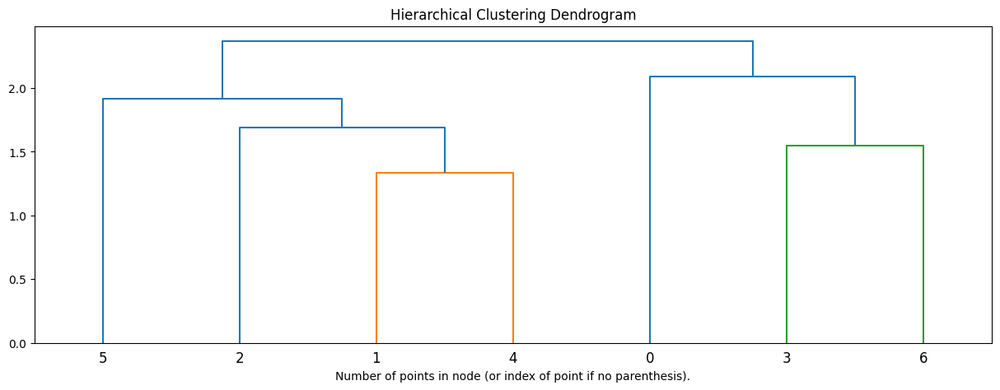

In [40]:
# plot the top three levels of the dendrogram
plt.figure(figsize=(15,5))
plot_dendrogram(clust_model_all[m], truncate_mode="level", p=10)
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [41]:
all_ids = x_clust_all[m].index
all_ids

Int64Index([0, 1, 3, 4, 5, 6, 7], dtype='int64', name='id')

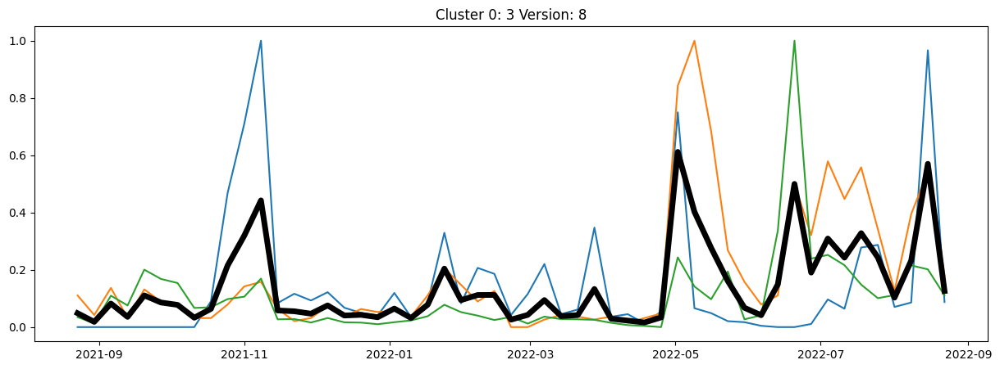

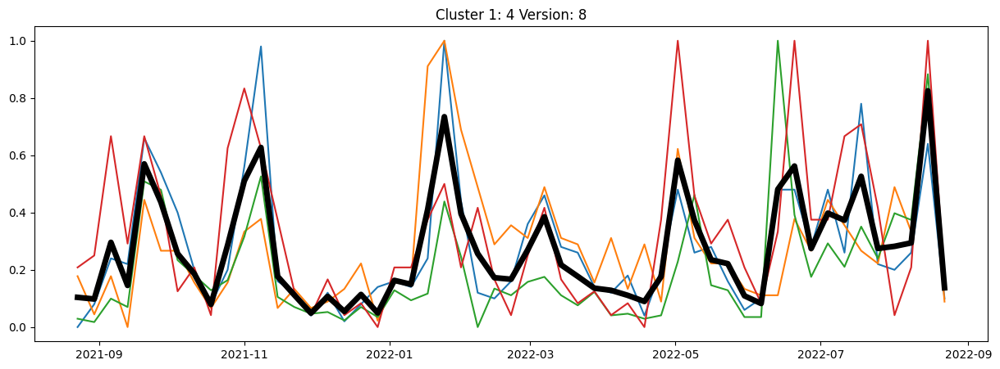

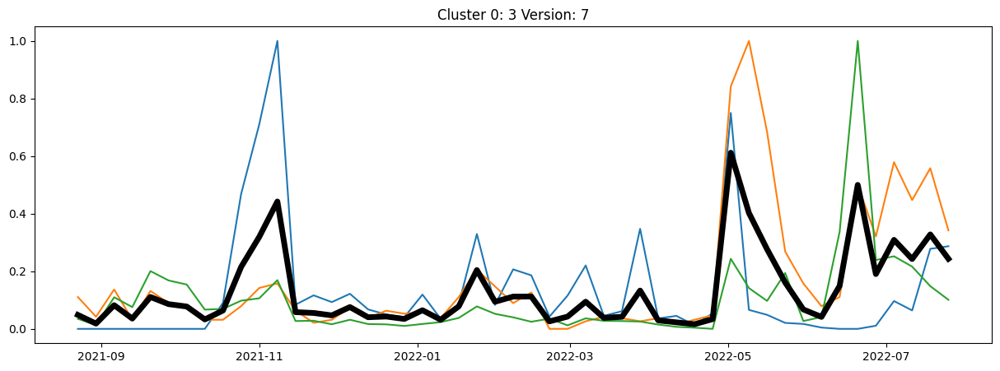

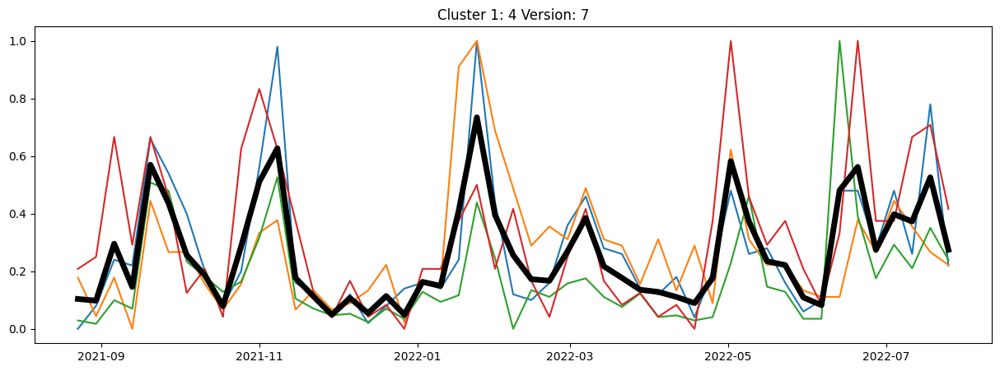

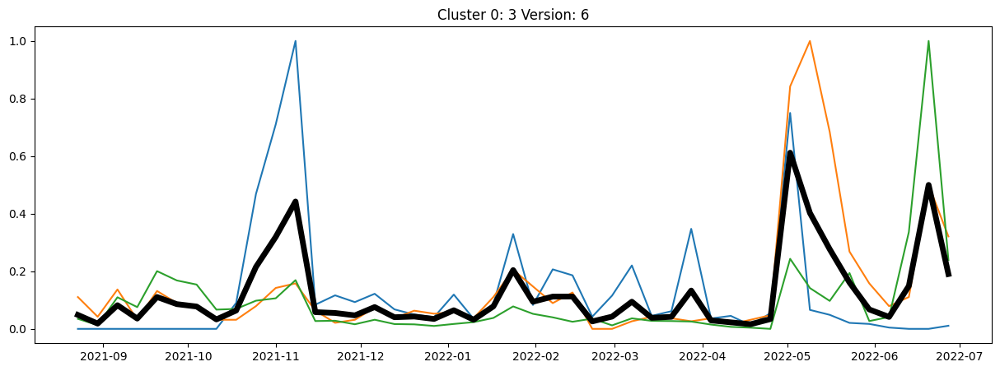

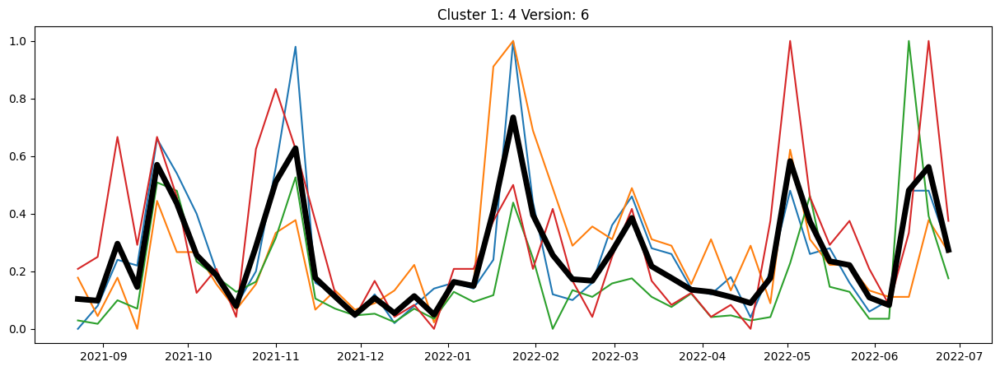

In [42]:
cluster_average_all = {}
for this_version in range(len(versions)):
    this_df = df[df['ts'] < np.min(all_dates[versions[this_version]]['forecast'])]
    y_sliding = sliding_window_features(this_df, [0,1,2,3])
    clust_model = clust_model_all[versions[this_version]]
    x_clust = x_clust_all[versions[this_version]]
    cluster_average = []
    all_ids = x_clust.index
    for i in range(n_clusters):
        idx = np.where(clust_model.labels_==i)
        idx2 = all_ids[idx[0]]

        _at = att.loc[att.id.isin(idx2)]
        ts = x_clust.loc[idx2].values
        t = x_clust.columns
        
        avg = ts.mean(axis=0)
        cluster_average.append(pd.DataFrame({"ts": t, "y": avg, "cluster": i}))

        plt.figure(figsize=(15,5))
        for j in range(ts.shape[0]):
            plt.plot(t, ts[j])
        plt.plot(t, avg, "k", linewidth=5)
        if ts.shape[0] == 1:
            plt.title("Cluster {}: ID: {} Version: {}".format(i, idx[0][0], versions[this_version]))
        else:
            plt.title("Cluster {}: {} Version: {}".format(i, ts.shape[0],  versions[this_version]))
        plt.show()
    cluster_average = pd.concat(cluster_average).reset_index(drop=True)
    cluster_average_all.update({versions[this_version]: cluster_average})

In [43]:
cluster_features_all = {}
for this_version in range(len(versions)):
    cluster_features = att.copy()
    clust_model = clust_model_all[versions[this_version]]
    cluster_features["cluster_norm"] = clust_model.labels_
    cluster_features = cluster_features[["id", "cluster_norm"]].copy()
    cluster_features_all.update({versions[this_version]: cluster_features})

In [44]:
clust_avg_yhat_all = {}
for this_version in range(len(versions)):
    cluster_average = cluster_average_all[versions[this_version]]
    clust_avg_yhat = forecast_ets(
        cluster_average.rename(columns={"cluster": "id"}),
        all_dates[versions[this_version]],
        num_cores=-1,
        freq=freq,
    )
    clust_avg_yhat_all.update({versions[this_version]: clust_avg_yhat})

DatetimeIndex(['2021-08-23', '2021-08-30', '2021-09-06', '2021-09-13',
               '2021-09-20', '2021-09-27', '2021-10-04', '2021-10-11',
               '2021-10-18', '2021-10-25', '2021-11-01', '2021-11-08',
               '2021-11-15', '2021-11-22', '2021-11-29', '2021-12-06',
               '2021-12-13', '2021-12-20', '2021-12-27', '2022-01-03',
               '2022-01-10', '2022-01-17', '2022-01-24', '2022-01-31',
               '2022-02-07', '2022-02-14', '2022-02-21', '2022-02-28',
               '2022-03-07', '2022-03-14', '2022-03-21', '2022-03-28',
               '2022-04-04', '2022-04-11', '2022-04-18', '2022-04-25',
               '2022-05-02', '2022-05-09', '2022-05-16', '2022-05-23',
               '2022-05-30', '2022-06-06', '2022-06-13', '2022-06-20',
               '2022-06-27', '2022-07-04', '2022-07-11', '2022-07-18',
               '2022-07-25'],
              dtype='datetime64[ns]', freq=None)
DatetimeIndex(['2022-08-01', '2022-08-08', '2022-08-15', '2022-08-22'

RUNNING THE L-BFGS-B CODE
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f= -3.43004D-01    |proj g|=  1.86857D+00

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f= -6.97614D-01    |proj g|=  3.99057D+00

At iterate    1    f= -3.50662D-01    |proj g|=  1.42599D-01

At iterate    1    f= -7.15128D-01    |proj g|=  4.17775D-01

At iterate    2    f= -3.53277D-01    |proj g|=  4.89141D-01

At iterate    3    f= -3.59042D-01    |proj g|=  2.41805D+00

At iterate    4    f= -3.67910D-01    |proj g|=  1.27315D+00

At iterate    2    f= -7.28657D-01    |proj g|=  3.86822D-01

At iterate    3    f= -7.43391D-01    |proj g|=  5.72784D-01

At iterate    5    f= -3.70064D-01    |proj g|=  6.62693D-01

At iterate    4    f= -7.58561D-01    |proj g

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f= -6.66616D-01    |proj g|=  3.84081D+00

At iterate    1    f= -6.72218D-01    |proj g|=  3.14937D+00

At iterate    2    f= -6.83024D-01    |proj g|=  4.11367D-01

At iterate    3    f= -6.86381D-01    |proj g|=  8.20333D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


At X0         1 variables are exactly at the bounds
At iterate    4    f= -6.93809D-01    |proj g|=  1.46614D+00

At iterate    0    f= -3.24062D-01    |proj g|=  1.81211D+00

At iterate    5    f= -7.05312D-01    |proj g|=  1.55395D+00

At iterate    6    f= -7.16754D-01    |proj g|=  6.77874D-01

At iterate    7    f= -7.19894D-01    |proj g|=  5.28492D-01

At iterate    1    f= -3.31060D-01    |proj g|=  1.45679D-01

At iterate    2    f= -3.35742D-01    |proj g

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f= -7.34466D-01    |proj g|=  4.64189D+00
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f= -3.53030D-01    |proj g|=  1.88401D+00

At iterate    1    f= -7.52647D-01    |proj g|=  5.20982D-01

At iterate    1    f= -3.59600D-01    |proj g|=  1.72037D-01

At iterate    2    f= -7.70062D-01    |proj g|=  3.19076D-01

At iterate    3    f= -8.01699D-01    |proj g|=  2.36214D+00

At iterate    2    f= -3.78580D-01    |proj g|=  2.70134D+00


At iterate    4    f= -8.04329D-01    |proj g|=  1.63654D-01
At iterate    3    f= -4.26801D-01    |proj g|=  3.68354D+00
  ys=-3.147E-03  -gs= 4.789E-02 BFGS update SKIPPED

At iterate    5    f= -8.06215D-01    |proj g|=  5.6227

In [45]:
yhat_clust_all = {}
for this_version in range(len(versions)):
    clust_avg_yhat = clust_avg_yhat_all[versions[this_version]]
    yhat_clust = clust_avg_yhat.copy()
    yhat_clust.rename(columns={"id": "cluster_norm"}, inplace=True)
    yhat_clust_all.update({versions[this_version]: yhat_clust})

In [46]:
yhat_clust_all[m].cluster_norm.nunique()

7

In [47]:

for this_version in range(len(versions)):
    cluster_features = cluster_features_all[versions[this_version]]
    yhat_clust = yhat_clust_all[versions[this_version]]
    cluster_features = pd.merge(
        cluster_features, 
        yhat_clust[["cluster_norm", "ts", "yhat"]],
        on="cluster_norm", how="left"
    )
    cluster_features["cluster_norm"] = cluster_features["cluster_norm"].astype(int)
    cluster_features_all.update({versions[this_version]: cluster_features})
cluster_features_all[m]

,id,cluster_norm,ts,yhat
0,1,0,2021-10-18,0.057515
1,1,0,2021-10-25,0.139287
2,1,0,2021-11-01,0.197189
3,1,0,2021-11-08,0.254129
4,1,0,2021-11-15,0.308635
...,...,...,...,...
349,0,0,2022-08-01,0.269081
350,0,0,2022-08-08,0.221012
351,0,0,2022-08-15,0.184472
352,0,0,2022-08-22,0.177761


### Cluster - Without Scaling

In [48]:
from sklearn.cluster import AgglomerativeClustering

In [49]:
x_clust_all = {}
for this_version in range(len(versions)):
    this_df = df[df['ts'] < np.min(all_dates[versions[this_version]]['forecast'])]
    x_clust = this_df.pivot_table(index="id", columns="ts", values="y").fillna(0)
    x_clust_all.update({versions[this_version]: x_clust})

x_clust_all[m].head()

ts,2021-08-23,2021-08-30,2021-09-06,2021-09-13,2021-09-20,2021-09-27,2021-10-04,2021-10-11,2021-10-18,2021-10-25,2021-11-01,2021-11-08,2021-11-15,2021-11-22,2021-11-29,2021-12-06,2021-12-13,2021-12-20,2021-12-27,2022-01-03,2022-01-10,2022-01-17,2022-01-24,2022-01-31,2022-02-07,2022-02-14,2022-02-21,2022-02-28,2022-03-07,2022-03-14,2022-03-21,2022-03-28,2022-04-04,2022-04-11,2022-04-18,2022-04-25,2022-05-02,2022-05-09,2022-05-16,2022-05-23,2022-05-30,2022-06-06,2022-06-13,2022-06-20,2022-06-27,2022-07-04,2022-07-11,2022-07-18,2022-07-25,2022-08-01,2022-08-08,2022-08-15,2022-08-22
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,519.0,787.0,1108.0,93.0,129.0,103.0,135.0,75.0,55.0,45.0,132.0,39.0,95.0,365.0,92.0,229.0,206.0,47.0,128.0,244.0,50.0,68.0,385.0,40.0,50.0,14.0,60.0,831.0,73.0,54.0,23.0,19.0,5.0,0.0,0.0,12.0,107.0,71.0,308.0,318.0,78.0,95.0,1071.0,97.0
1,1.0,5.0,13.0,12.0,34.0,28.0,21.0,11.0,5.0,11.0,29.0,50.0,9.0,7.0,3.0,7.0,2.0,5.0,8.0,9.0,8.0,13.0,51.0,23.0,7.0,6.0,9.0,19.0,24.0,15.0,14.0,8.0,7.0,10.0,3.0,11.0,25.0,14.0,15.0,9.0,4.0,6.0,25.0,25.0,15.0,25.0,14.0,40.0,12.0,11.0,14.0,33.0,6.0
3,8.0,2.0,8.0,0.0,20.0,12.0,12.0,7.0,3.0,7.0,15.0,17.0,3.0,6.0,3.0,4.0,6.0,10.0,1.0,7.0,7.0,41.0,45.0,31.0,22.0,13.0,16.0,14.0,22.0,14.0,13.0,7.0,14.0,6.0,13.0,4.0,28.0,14.0,10.0,10.0,6.0,5.0,5.0,17.0,12.0,20.0,16.0,12.0,10.0,22.0,15.0,35.0,4.0
4,21.0,8.0,26.0,6.0,25.0,17.0,15.0,6.0,6.0,15.0,27.0,30.0,12.0,4.0,6.0,14.0,7.0,12.0,10.0,11.0,7.0,21.0,39.0,28.0,17.0,24.0,0.0,0.0,5.0,8.0,7.0,5.0,7.0,3.0,6.0,9.0,160.0,190.0,130.0,51.0,30.0,15.0,21.0,95.0,61.0,110.0,85.0,106.0,65.0,24.0,75.0,103.0,34.0
5,8.0,6.0,20.0,15.0,90.0,85.0,43.0,34.0,25.0,31.0,57.0,93.0,21.0,15.0,11.0,12.0,7.0,15.0,9.0,25.0,19.0,23.0,78.0,45.0,3.0,26.0,22.0,30.0,33.0,22.0,16.0,24.0,10.0,11.0,8.0,10.0,42.0,82.0,28.0,25.0,9.0,9.0,174.0,70.0,33.0,53.0,39.0,63.0,44.0,71.0,67.0,154.0,36.0


In [50]:
n_clusters = 2
clust_model_all = {}
for this_version in range(len(versions)):
    this_df = df[df['ts'] < np.min(all_dates[versions[this_version]]['forecast'])]
    x_clust = x_clust_all[versions[this_version]]
    clust_model = AgglomerativeClustering(
        n_clusters=n_clusters,
        linkage="ward",
        compute_distances=True
    )
    clust_model = clust_model.fit(x_clust)
    clust_model_all.update({versions[this_version]: clust_model})


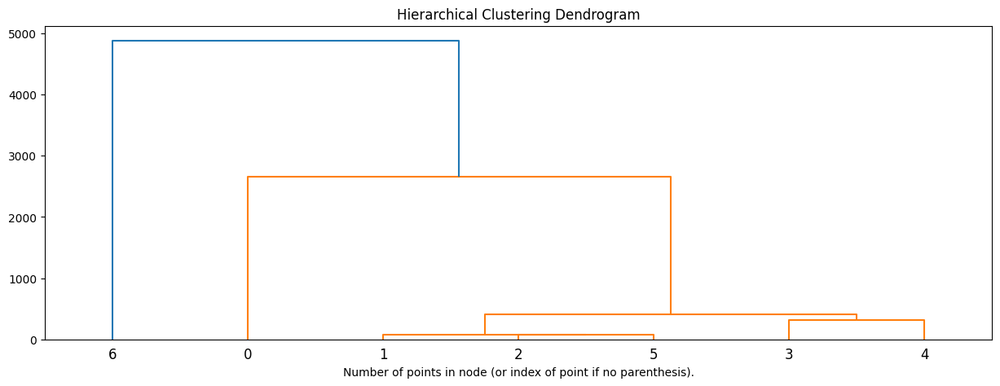

In [51]:
# plot the top three levels of the dendrogram
plt.figure(figsize=(15,5))
plot_dendrogram(clust_model_all[m], truncate_mode="level", p=10)
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [52]:
all_ids = x_clust_all[m].index
all_ids

Int64Index([0, 1, 3, 4, 5, 6, 7], dtype='int64', name='id')

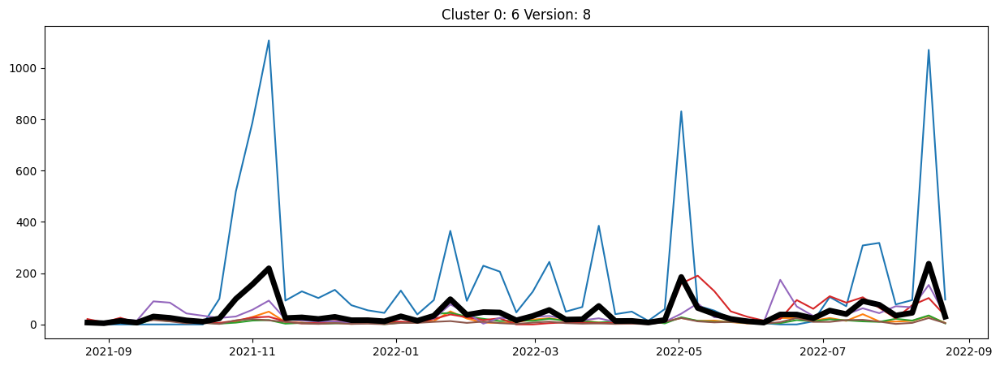

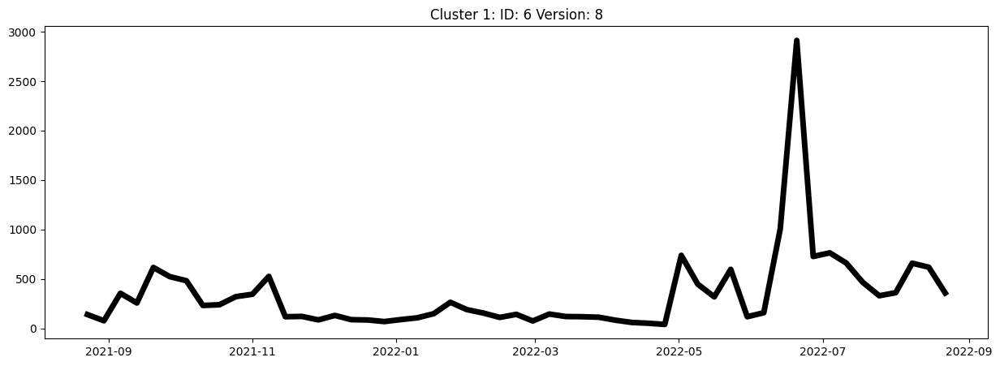

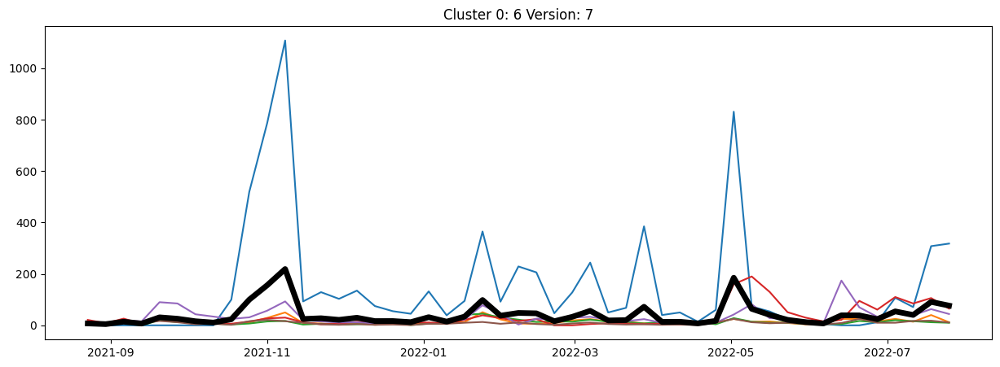

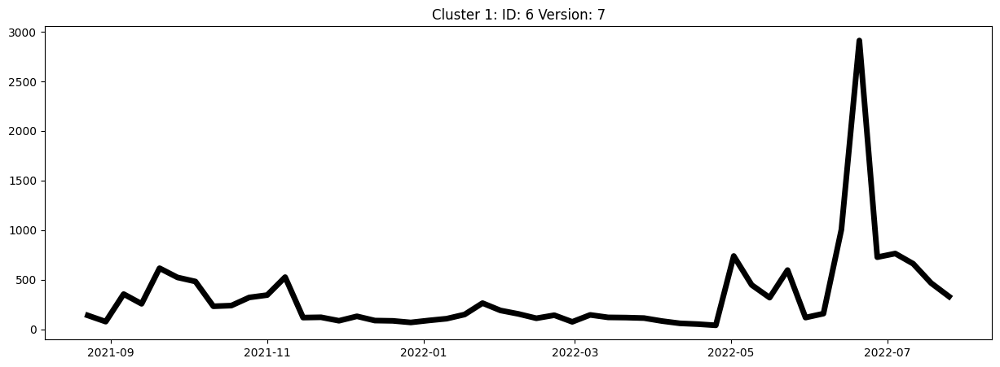

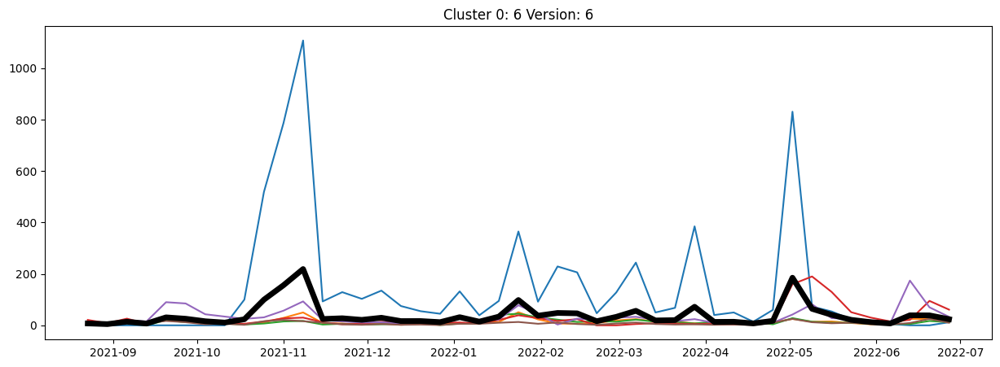

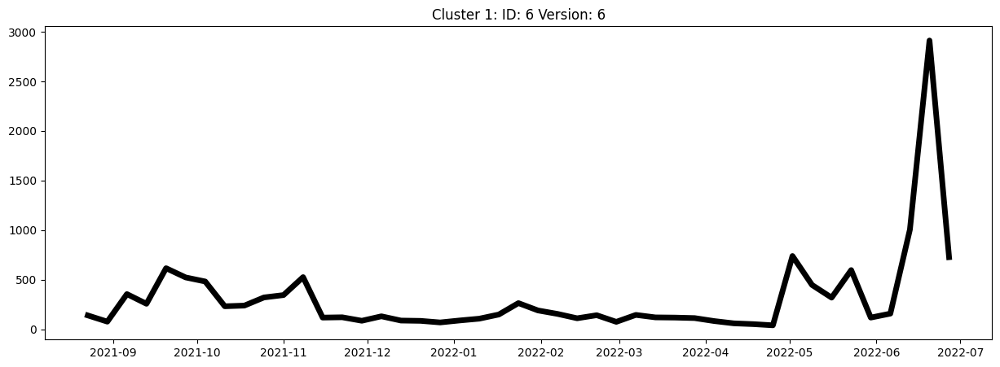

In [53]:
cluster_average_all = {}
for this_version in range(len(versions)):
    this_df = df[df['ts'] < np.min(all_dates[versions[this_version]]['forecast'])]
    y_sliding = sliding_window_features(this_df, [0,1,2,3])
    clust_model = clust_model_all[versions[this_version]]
    x_clust = x_clust_all[versions[this_version]]
    cluster_average = []
    all_ids = x_clust.index
    for i in range(n_clusters):
        idx = np.where(clust_model.labels_==i)
        idx2 = all_ids[idx[0]]

        _at = att.loc[att.id.isin(idx2)]
        ts = x_clust.loc[idx2].values
        t = x_clust.columns
        
        avg = ts.mean(axis=0)
        cluster_average.append(pd.DataFrame({"ts": t, "y": avg, "cluster": i}))

        plt.figure(figsize=(15,5))
        for j in range(ts.shape[0]):
            plt.plot(t, ts[j])
        plt.plot(t, avg, "k", linewidth=5)
        if ts.shape[0] == 1:
            plt.title("Cluster {}: ID: {} Version: {}".format(i, idx[0][0], versions[this_version]))
        else:
            plt.title("Cluster {}: {} Version: {}".format(i, ts.shape[0],  versions[this_version]))
        plt.show()
    cluster_average = pd.concat(cluster_average).reset_index(drop=True)
    cluster_average_all.update({versions[this_version]: cluster_average})

In [54]:
cluster_features_actual_all = {}
for this_version in range(len(versions)):
    cluster_features_actual = att.copy()
    clust_model = clust_model_all[versions[this_version]]
    cluster_features_actual["cluster"] = clust_model.labels_
    cluster_features_actual = cluster_features_actual[["id", "cluster"]].copy()
    cluster_features_actual_all.update({versions[this_version]: cluster_features_actual})

In [55]:
clust_avg_yhat_all = {}
for this_version in range(len(versions)):
    cluster_average = cluster_average_all[versions[this_version]]
    clust_avg_yhat = forecast_ets(
        cluster_average.rename(columns={"cluster": "id"}),
        all_dates[versions[this_version]],
        num_cores=-1,
        freq=freq,
    )
    clust_avg_yhat_all.update({versions[this_version]: clust_avg_yhat})

DatetimeIndex(['2021-08-23', '2021-08-30', '2021-09-06', '2021-09-13',
               '2021-09-20', '2021-09-27', '2021-10-04', '2021-10-11',
               '2021-10-18', '2021-10-25', '2021-11-01', '2021-11-08',
               '2021-11-15', '2021-11-22', '2021-11-29', '2021-12-06',
               '2021-12-13', '2021-12-20', '2021-12-27', '2022-01-03',
               '2022-01-10', '2022-01-17', '2022-01-24', '2022-01-31',
               '2022-02-07', '2022-02-14', '2022-02-21', '2022-02-28',
               '2022-03-07', '2022-03-14', '2022-03-21', '2022-03-28',
               '2022-04-04', '2022-04-11', '2022-04-18', '2022-04-25',
               '2022-05-02', '2022-05-09', '2022-05-16', '2022-05-23',
               '2022-05-30', '2022-06-06', '2022-06-13', '2022-06-20',
               '2022-06-27', '2022-07-04', '2022-07-11', '2022-07-18',
               '2022-07-25'],
              dtype='datetime64[ns]', freq=None)
DatetimeIndex(['2022-08-01', '2022-08-08', '2022-08-15', '2022-08-22'

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f=  5.06117D+00    |proj g|=  8.99900D-01

At iterate    1    f=  5.02263D+00    |proj g|=  1.76935D-01

At iterate    2    f=  4.97280D+00    |proj g|=  3.29277D-02

At iterate    3    f=  4.96406D+00    |proj g|=  4.35092D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10


At X0         1 variables are exactly at the bounds
At iterate    4    f=  4.96243D+00    |proj g|=  2.10799D-02

At iterate    0    f=  6.84118D+00    |proj g|=  8.99900D-01

At iterate    1    f=  6.75139D+00    |proj g|=  3.33908D-01

At iterate    5    f=  4.96067D+00    |proj g|=  1.48483D-02

At iterate    6    f=  4.96061D+00    |proj g|=  1.99881D-02

At iterate    2    f=  6.69321D+00    |proj g|=  2.19340D-01

At iterate    7    f=  4.96056D+00    |proj g

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f=  5.12142D+00    |proj g|=  8.99900D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f=  6.83454D+00    |proj g|=  8.99900D-01

At iterate    1    f=  5.11364D+00    |proj g|=  2.08057D-01

At iterate    1    f=  6.75254D+00    |proj g|=  3.47380D-01

At iterate    2    f=  5.03546D+00    |proj g|=  9.84828D-02

At iterate    2    f=  6.68886D+00    |proj g|=  2.38820D-01

At iterate    3    f=  5.03390D+00    |proj g|=  1.16118D-01

  ys=-1.269E-05  -gs= 1.551E-03 BFGS update SKIPPED
At iterate    3    f=  6.63890D+00    |proj g|=  9.12571D-02

At iterate    4    f=  6.63141D+00    |proj g|=  1.21033D-02


At iterate    4    f=  5.01257D+00    |proj g|=  1.662

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds

At iterate    0    f=  5.21820D+00    |proj g|=  8.79757D-01

At iterate    1    f=  5.20116D+00    |proj g|=  1.68919D-01

At iterate    2    f=  5.13675D+00    |proj g|=  6.15660D-02
RUNNING THE L-BFGS-B CODE

           * * *


Machine precision = 2.220D-16
 N =            5     M =           10

At X0         1 variables are exactly at the bounds
At iterate    3    f=  5.13526D+00    |proj g|=  8.05401D-02
  ys=-2.028E-04  -gs= 1.375E-03 BFGS update SKIPPED

At iterate    0    f=  6.66809D+00    |proj g|=  8.99900D-01

At iterate    1    f=  6.55627D+00    |proj g|=  3.42477D-01

At iterate    4    f=  5.13181D+00    |proj g|=  1.52928D-01

At iterate    2    f=  6.50360D+00    |proj g|=  2.24108D-01

At iterate    3    f=  6.46130D+00    |proj g|=  1.34202D-02

At iterate    5    f=  5.13134D+00    |proj g|=  1.5300

In [56]:
yhat_clust_all = {}
for this_version in range(len(versions)):
    clust_avg_yhat = clust_avg_yhat_all[versions[this_version]]
    yhat_clust = clust_avg_yhat.copy()
    yhat_clust.rename(columns={"id": "cluster"}, inplace=True)
    yhat_clust_all.update({versions[this_version]: yhat_clust})

In [57]:
yhat_clust_all[m].cluster.nunique()

7

In [58]:

for this_version in range(len(versions)):
    cluster_features_actual = cluster_features_actual_all[versions[this_version]]
    yhat_clust = yhat_clust_all[versions[this_version]]
    cluster_features_actual = pd.merge(
        cluster_features_actual, 
        yhat_clust[["cluster", "ts", "yhat"]],
        on="cluster", how="left"
    )
    cluster_features_actual["cluster"] = cluster_features_actual["cluster"].astype(int)
    cluster_features_actual_all.update({versions[this_version]: cluster_features_actual})
cluster_features_actual_all[m]

,id,cluster,ts,yhat
0,1,0,2021-10-18,13.475627
1,1,0,2021-10-25,46.109380
2,1,0,2021-11-01,72.098558
3,1,0,2021-11-08,84.425135
4,1,0,2021-11-15,74.662694
...,...,...,...,...
325,0,1,2022-08-01,450.688462
326,0,1,2022-08-08,486.843454
327,0,1,2022-08-15,525.801129
328,0,1,2022-08-22,501.017062


### Final Features

In [59]:
def summary_feature(df, dates, target="y", group=None):
    if group is None:
        group = ["id"]
    stats = ["mean", "max", "min", "std", "sum"]
    g = "_".join(group)
    
    train_dates = dates["train"]

    df_features = df.loc[df.ts.isin(train_dates)].copy()
    df_features = df_features.groupby(group)[target].agg(stats)
    df_features.reset_index(inplace=True)
    for col in stats:
        df_features.rename(columns={col: "{}_{}_{}".format(target, g, col)}, inplace=True)
        
    return df_features

In [60]:
summary_feature(df, all_dates[m], group=["id"])

,id,y_id_mean,y_id_max,y_id_min,y_id_std,y_id_sum
0,0,175.951220,1108.0,0.0,241.874653,7214.0
1,1,14.836735,51.0,1.0,11.504251,727.0
2,3,12.204082,45.0,0.0,9.280310,598.0
3,4,32.306122,190.0,0.0,42.876861,1583.0
4,5,34.142857,174.0,3.0,31.538997,1673.0
5,6,8.734694,25.0,1.0,6.088841,428.0
6,7,327.918367,2912.0,40.0,442.832777,16068.0


In [61]:
def process_data(
    df, dates,
    yhat_hw, y_sliding, cluster_features_actual, cluster_features,
):
    from scipy import stats
    X = df.copy()
    
       ## encode time
    X["week_sin"] = np.sin(2 * np.pi * X["woy"] / 52)
    X["week_cos"] = np.cos(2 * np.pi * X["woy"] / 52)
    X["month_sin"] = np.sin(2 * np.pi * X["month"] / 12)
    X["month_cos"] = np.cos(2 * np.pi * X["month"] / 12)
    
    ## summary features at different levels 
    groups = [
        ["id"],
#         ["woy"],
#         ["month"],
#         ["id", "woy"],
#         ["id", "month"],
    ]
    for g in groups:
        sf = summary_feature(X, dates, group=g)
        X = pd.merge(X, sf, on=g, how="left")
        
    ## holt winters projection
    X = pd.merge(
        X, yhat_hw[["id", "ts", "yhat"]].rename(columns={"yhat": "y_hw"}), 
        on=["id", "ts"], how="left"
    )    
    X["next_hw"] = X[["ts", "id", "y_hw"]].sort_values(by=["id", "ts"]).groupby(["id"])["y_hw"].shift(-1)
    X["prev_hw"] = X[["ts", "id", "y_hw"]].sort_values(by=["id", "ts"]).groupby(["id"])["y_hw"].shift(1)
    X["next_hw"] = X["next_hw"].fillna(X["y_hw"])
    X["prev_hw"] = X["prev_hw"].fillna(X["y_hw"])
    X["slope_hw"] = ((X["y_hw"] - X["prev_hw"]) + ((X["next_hw"] - X["prev_hw"]) / 2)) / 2
    
    ## differenced of Holt Winters
    a = yhat_hw[["id", "ts", "yhat"]].rename(columns={"yhat": "d1_y_hw"}).copy()
    X_diff = []
    all_ids = X.id.unique()
    for i in range(len(all_ids)):
        id_ = all_ids[i]
        tmp = a.loc[a.id == id_].reset_index(drop=True)
        tmp2 = tmp.copy()
        tmp2["d1_y_hw"] = tmp["d1_y_hw"].diff()
        tmp2["d1_y_hw"].fillna(tmp["d1_y_hw"], inplace=True)
        X_diff.append(tmp2)
    X_diff = pd.concat(X_diff).reset_index(drop=True)
    X = pd.merge(
        X, X_diff[["id", "ts", "d1_y_hw"]], 
        on=["id", "ts"], how="left"
    )
    
    ## sliding windows of y
    X = pd.merge(X, y_sliding.drop(columns=["y"]), on=["ts", "id"], how="right")    
    
    ## slope estimate of y 
    lag_cols = [x for x in X.columns if ("y_lag_" in x) and ("div" not in x)]
    mid = len(lag_cols) / 2
    mid = lag_cols[int(mid)]
    start = lag_cols[0]
    end = lag_cols[len(lag_cols) - 1]
    X["slope_y"] = ((X[mid] - X[start]) + ((X[end] - X[mid]) / 2)) / 2
    
    ## ratio of current projection to past lags
    for c in lag_cols:
        col = "ratio_hw_to_{}".format(c.replace("y_", ""))
        X[col] = X["y_hw"] / X[c]
        X[col] = np.nan_to_num(X[col], nan=0, posinf=0, neginf=0)
    
    ## cluster features
    X = pd.merge(
        X, cluster_features_actual.rename(columns={"yhat": "y_clust_avg"}), 
        on=["id", "ts"], how="left"
    )
    X["next_clust"] = X[["ts", "id", "y_clust_avg"]].sort_values(by=["id", "ts"]).groupby(["id"])["y_clust_avg"].shift(-1)
    X["prev_clust"] = X[["ts", "id", "y_clust_avg"]].sort_values(by=["id", "ts"]).groupby(["id"])["y_clust_avg"].shift(1)
    X["next_clust"] = X["next_clust"].fillna(X["y_clust_avg"])
    X["prev_clust"] = X["prev_clust"].fillna(X["y_clust_avg"])
    X["slope_clust"] = ((X["y_clust_avg"] - X["prev_clust"]) + ((X["next_clust"] - X["prev_clust"]) / 2)) / 2
    
    ## ratio of fitted demand to cluster average
    X["ratio_hw_to_avg"] = X["y_hw"] / X["y_clust_avg"]
    X["ratio_hw_to_avg"] = np.nan_to_num(X["ratio_hw_to_avg"], nan=0, posinf=0, neginf=0)
    lag_cols = [x for x in X.columns if ("y_lag_" in x) and ("div" not in x)]
    for c in lag_cols:
        col = "ratio_hw_to_{}".format(c.replace("y_", ""))
        X[col] = X["y_hw"] / X[c]
        X[col] = np.nan_to_num(X[col], nan=0, posinf=0, neginf=0)
        
        col = "ratio_clust_to_{}".format(c.replace("y_", ""))
        X[col] = X["y_clust_avg"] / X[c]
        X[col] = np.nan_to_num(X[col], nan=0, posinf=0, neginf=0)
    
    ## cluster features
    X = pd.merge(
        X, cluster_features.rename(columns={"yhat": "y_clust_avg_norm"}), 
        on=["id", "ts"], how="left"
    )
    X["next_clust_norm"] = X[["ts", "id", "y_clust_avg_norm"]].sort_values(by=["id", "ts"]).groupby(["id"])["y_clust_avg_norm"].shift(-1)
    X["prev_clust_norm"] = X[["ts", "id", "y_clust_avg_norm"]].sort_values(by=["id", "ts"]).groupby(["id"])["y_clust_avg_norm"].shift(1)
    X["next_clust_norm"] = X["next_clust_norm"].fillna(X["y_clust_avg_norm"])
    X["prev_clust_norm"] = X["prev_clust_norm"].fillna(X["y_clust_avg_norm"])
    X["slope_clust_norm"] = ((X["y_clust_avg_norm"] - X["prev_clust_norm"]) + ((X["next_clust_norm"] - X["prev_clust_norm"]) / 2)) / 2
    
    
    X["id"] = X["id"].astype(int)
#     X["cluster"] = X["cluster"].astype(int)
    
    train_dates = dates["train"]
    test_dates = dates["test"]
    
    train = X.loc[X.ts.isin(train_dates)].reset_index(drop=True)
    test = X.loc[X.ts.isin(test_dates)].reset_index(drop=True)
    
    print(X.shape, train.shape, test.shape)
    
    x_train = train.drop(columns=["y", "ts", "sku", "month", "woy"])
    x_test = test.drop(columns=["y", "ts", "sku", "month", "woy"])
    y_train = train["y"]
    y_test = test["y"]
    
    return train, test, x_train, x_test, y_train, y_test 

## RandomForest

In [62]:
sliding_param = 3

In [63]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from lightgbm import LGBMRegressor

### Modeling

In [64]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 370 entries, 0 to 369
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   ts              370 non-null    datetime64[ns]
 1   id              370 non-null    int64         
 2   y               370 non-null    float64       
 3   cases           370 non-null    int64         
 4   description     370 non-null    object        
 5   level2          316 non-null    object        
 6   prod_code       370 non-null    int64         
 7   prod_hierarchy  370 non-null    object        
 8   size            370 non-null    float64       
 9   sku             370 non-null    int64         
 10  sku_desc        370 non-null    object        
 11  sku_type        370 non-null    object        
 12  units           370 non-null    object        
 13  __idx           370 non-null    int64         
 14  month           370 non-null    int64         
 15  woy   

In [65]:
models_all = {}
for this_version in range(len(versions)):
    print("Version {}".format(versions[this_version]))
    this_df = df[df['ts'] < np.min(all_dates[versions[this_version]]['forecast'])]
    pred_hw = pred_hws[versions[this_version]]
    y_sliding = y_sliding_all[versions[this_version]]
    cluster_features_actual = cluster_features_actual_all[versions[this_version]]
    cluster_features = cluster_features_all[versions[this_version]]
    
    models = {}
    drop_cols = []

    train, test, x_train, x_test, y_train, y_test = process_data(
        df.loc[~df.id.isin([2])].drop(columns=["sku_desc", "description"]), all_dates[versions[this_version]],
        pred_hw, y_sliding[sliding_param], cluster_features_actual, cluster_features,
    )

    x_train.drop(columns=drop_cols, inplace=True)
    x_test.drop(columns=drop_cols, inplace=True)

    x_train.dropna(axis=1, inplace=True)
    x_test = x_test[x_train.columns]

    # x_train.fillna(0, inplace=True)
    # x_test.fillna(0, inplace=True)

    cols = x_train.select_dtypes(exclude=np.number).columns.tolist() + ["sku", "prod_code", "cases", "size"]
    encoders = {}
    for c in cols:
        if c not in x_train.columns:
            continue
        if c == "id":
            continue
        enc = LabelEncoder()
        if "event" in c:
            enc.fit(pd.concat([x_train[c], x_test[c]]))
            x_train[c] = enc.transform(x_train[c])
            x_test[c] = enc.transform(x_test[c])
        else:
            x_train[c] = enc.fit_transform(x_train[c])
            x_test[c] = enc.transform(x_test[c])
        encoders.update({c: enc})

    model = RandomForestRegressor(
        n_estimators=500,
        max_features="sqrt",
        n_jobs=-1,
        random_state=42
    )
    model.fit(x_train, y_train)

    yhat_train = model.predict(x_train)
    yhat_test = model.predict(x_test)

    yhat_train = np.clip(yhat_train, 0, None)
    yhat_test = np.clip(yhat_test, 0, None)

    models = {
        "model": model,
        "train": train,
        "test": test,
        "x_train": x_train,
        "x_test": x_test,
        "y_train": y_train,
        "y_test": y_test,
        "yhat_train": yhat_train,
        "yhat_test": yhat_test,
    }
    models_all.update({versions[this_version]: models})

Version 8
(321, 61) (293, 61) (28, 61)
Version 7
(293, 61) (265, 61) (28, 61)
Version 6
(265, 61) (237, 61) (28, 61)


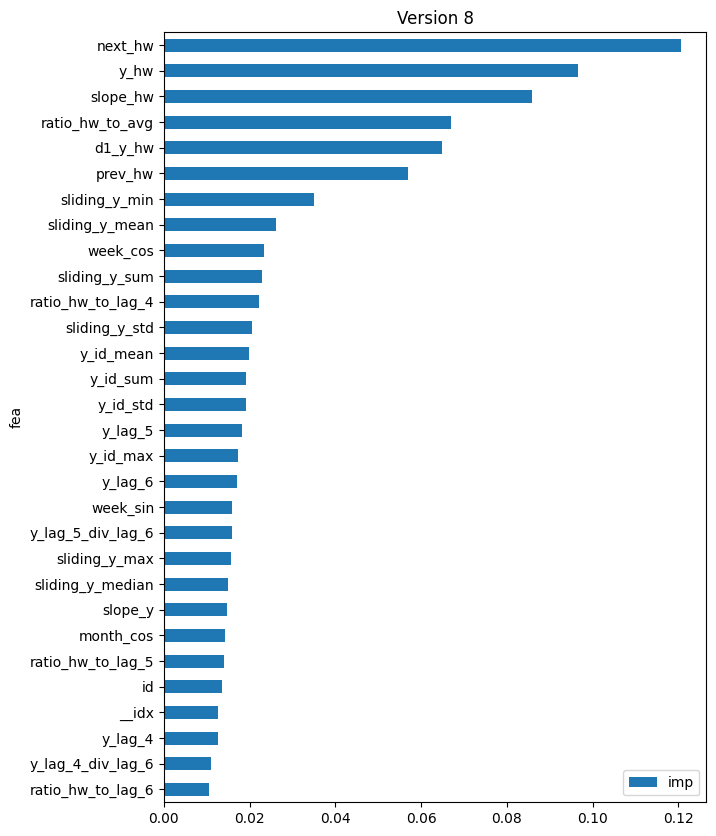

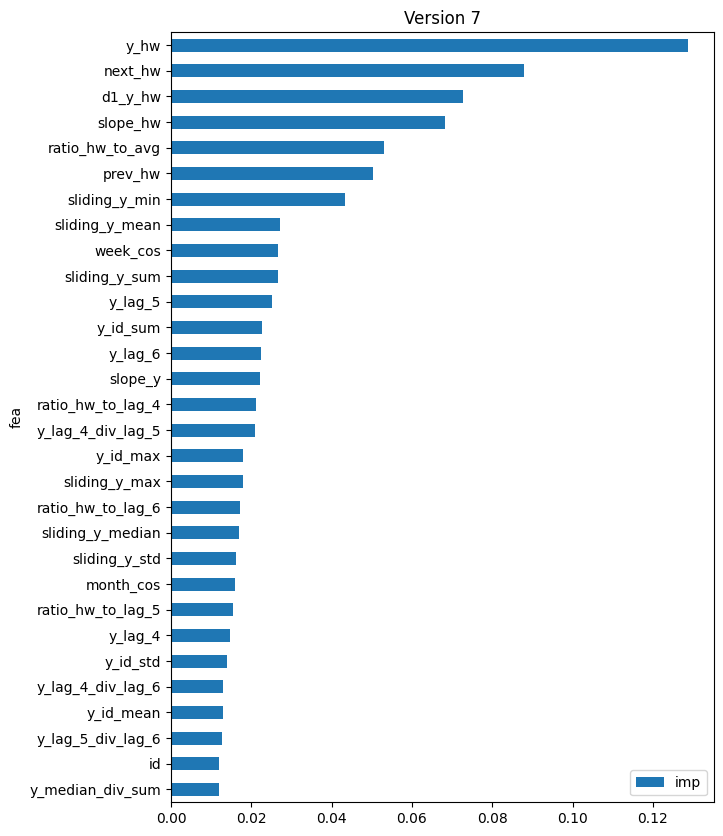

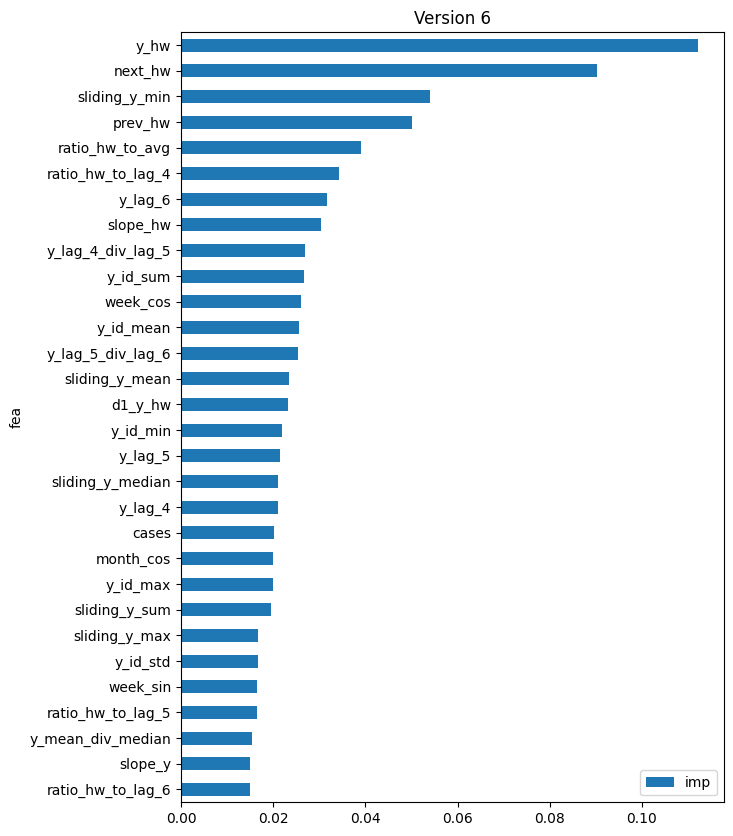

In [66]:
#models_all = {}
for this_version in range(len(versions)):
    models = models_all[versions[this_version]]
    k = models["model"]
    x_train = models["x_train"]

    x_train.dropna(axis=1, inplace=True)

    fea_imp = pd.DataFrame({
        "imp": k.feature_importances_, 
        "fea": x_train.columns
    })
    fea_imp.sort_values(by="imp", ascending=True, inplace=True)
    fea_imp.set_index("fea", inplace=True)
    fea_imp.tail(30).plot.barh(figsize=(7,10))
    plt.title("Version {}".format(versions[this_version]))
    plt.show()        

In [67]:
rf_yhat = []
for this_version in range(len(versions)):
    models = models_all[versions[this_version]]
    aaa = models["train"].copy()
    aaa["yhat"] = models["yhat_train"]
    aaa['version'] = versions[this_version]
    this_rf_yhat = [aaa]

    aaa = models["test"].copy()
    aaa["yhat"] = models["yhat_test"]
    this_rf_yhat.append(aaa)
    this_rf_yhat = pd.concat(this_rf_yhat).reset_index(drop=True)
    this_rf_yhat['version'] = versions[this_version]
    rf_yhat.append(this_rf_yhat)

rf_yhat = pd.concat(rf_yhat).reset_index(drop=True)

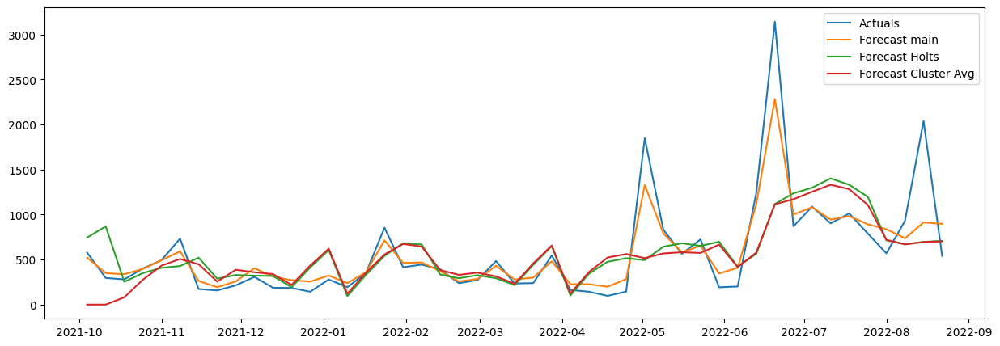

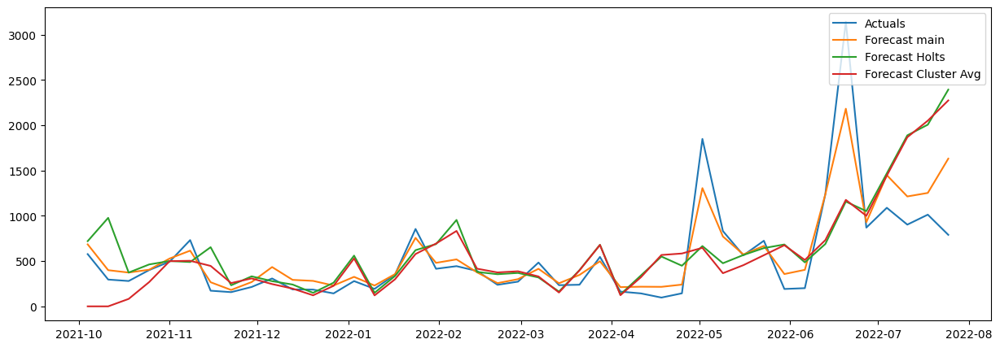

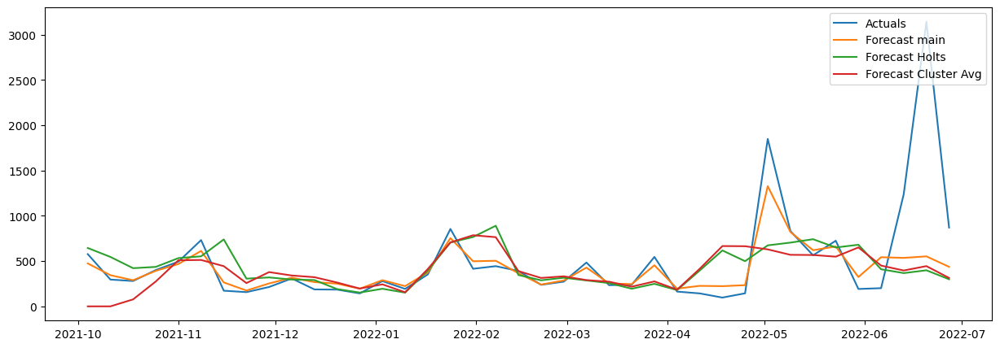

In [68]:
for this_version in range(len(versions)):
    this_rf_yhat = rf_yhat[rf_yhat['version'] == versions[this_version]]
    ts = this_rf_yhat.groupby("ts").sum()
    plt.figure(figsize=(15,5))
    plt.plot(ts.y, label="Actuals")
    plt.plot(ts.yhat, label="Forecast main")
    plt.plot(ts.y_hw, label="Forecast Holts")
    plt.plot(ts.y_clust_avg, label="Forecast Cluster Avg")
    plt.legend(loc = "upper right")
    plt.show()

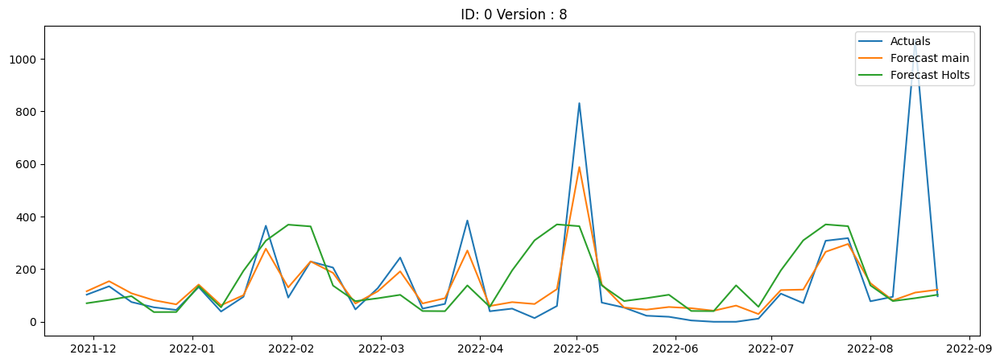

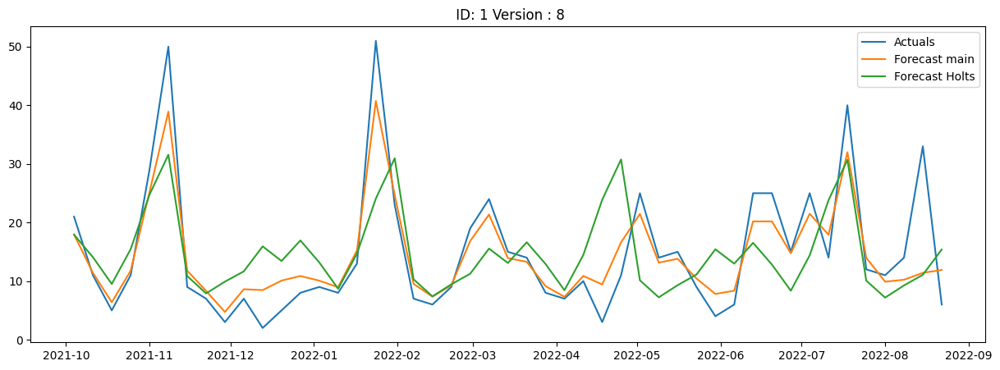

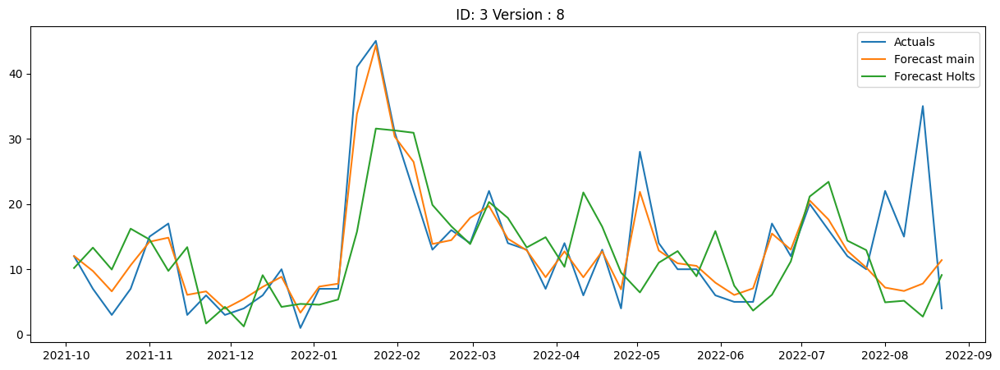

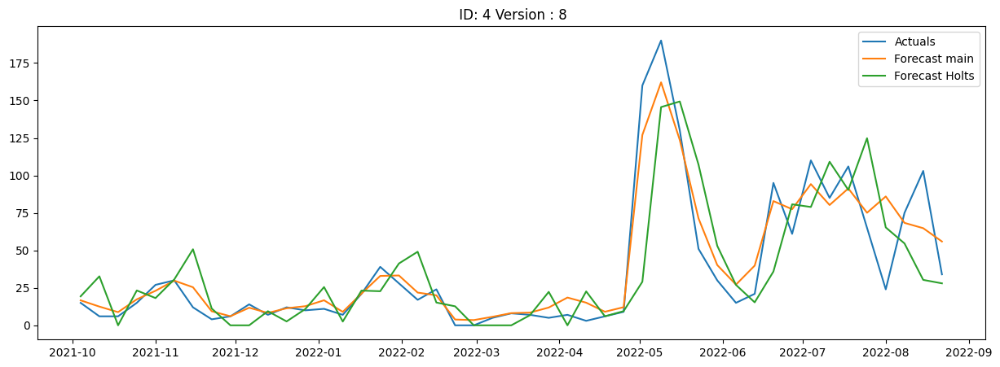

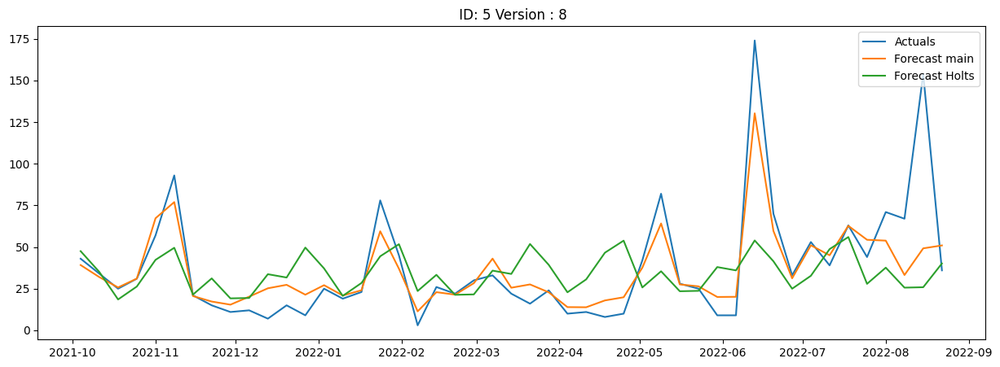

...

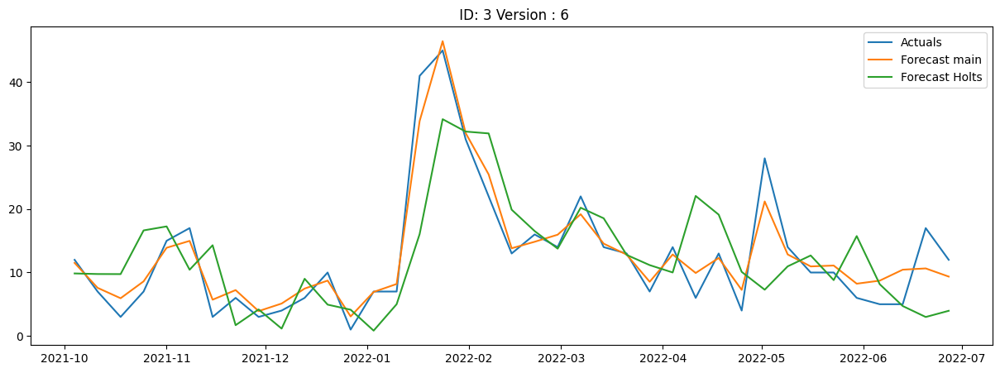

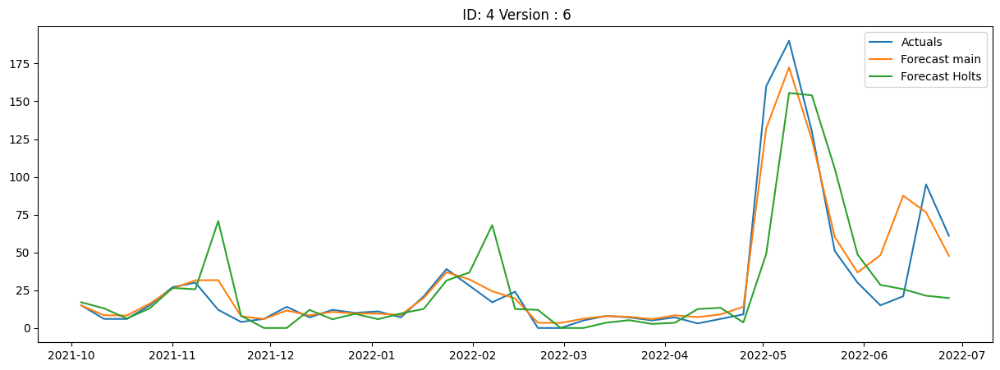

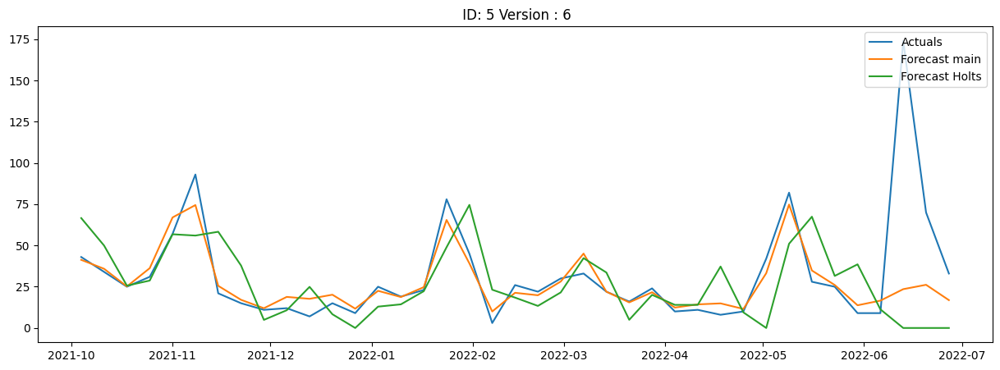

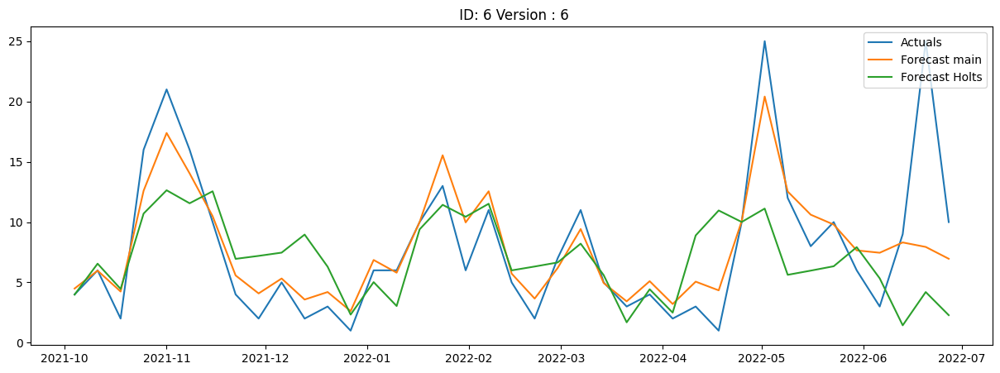

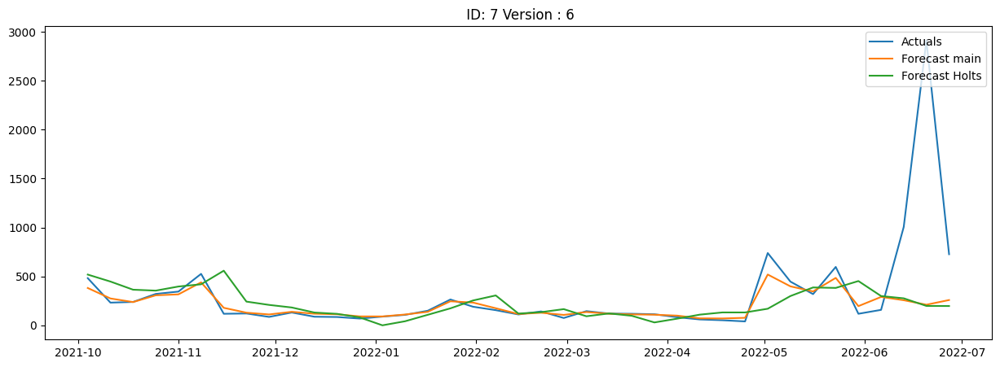

In [69]:
for this_version in range(len(versions)):
    for c in rf_yhat.id.unique():
        ts = rf_yhat.loc[ (rf_yhat.id == c) & (rf_yhat.version == versions[this_version])].groupby("ts").sum()
        plt.figure(figsize=(15,5))
        plt.plot(ts.y, label="Actuals")
        plt.plot(ts.yhat, label="Forecast main")
        plt.plot(ts.y_hw, label="Forecast Holts")
        plt.legend(loc = "upper right")
        plt.title(" ID: {} Version : {}".format(c,versions[this_version] ))
        plt.show()

### Results

NameError: name 'pd' is not defined

In [70]:
results = pd.DataFrame()
for i in range(len(versions)):
    this_ts = rf_yhat[rf_yhat["version"] == versions[i]]
    for _id in this_ts.id.unique():
        ts = this_ts.loc[(this_ts["id"] == _id)].reset_index(drop=True)
        test = ts.loc[ ts.ts.isin( all_dates[versions[i]]["test"]) ].copy()
        
        metrics = calc_metrics(test.y, test.yhat)
        metrics.update({
            "id": _id,
            "version" : versions[i],
            "sku": ts["sku"][0],
            "test_start": all_dates[versions[i]]["test"][0],
            "test_end": all_dates[versions[i]]["test"][-1],
            "total_actual": test.y.sum(),
            "total_forecast": test.yhat.sum(),
        })
        results = results.append(metrics, ignore_index=True, sort=False)

main_cols = ["id", "sku", "version", "test_start", "test_end", "total_actual", "total_forecast"]
results = results[main_cols + list(results.drop(columns=main_cols).columns)].copy()
results["sp1"] = results["total_actual"] / results["total_forecast"]
results["sp1"] = np.nan_to_num(results["sp1"], nan=1, posinf=0, neginf=0)
results['customer'] = "All"

results.sort_values(by="id").reset_index(drop=True).set_index(["version", "id"])
results.groupby("sku").mean()
results.groupby("sku").median()
results

    

/tmp/ipykernel_393445/27215507.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append(metrics, ignore_index=True, sort=False)
/tmp/ipykernel_393445/27215507.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append(metrics, ignore_index=True, sort=False)
/tmp/ipykernel_393445/27215507.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append(metrics, ignore_index=True, sort=False)
/tmp/ipykernel_393445/27215507.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append(metrics, ignore_index=True, sort=False)
/tmp/ipykernel_393445/27215507.py:18: FutureWarn

,id,sku,version,test_start,test_end,total_actual,total_forecast,rmse,mae,smape,mape,maape,sp1,customer
0,0,80692947,8,2022-08-01,2022-08-22,1341.0,460.728,481.414205,266.9160,0.655808,0.545632,0.462872,2.910611,All
1,1,80702886,8,2022-08-01,2022-08-22,64.0,43.438,11.360745,8.0895,0.511969,0.501653,0.429746,1.473364,All
2,3,82332207,8,2022-08-01,2022-08-22,76.0,33.064,16.455675,14.4340,1.003811,0.963877,0.708806,2.298572,All
3,4,82332208,8,2022-08-01,2022-08-22,236.0,275.036,38.160444,32.1870,0.540683,0.921636,0.554389,0.858069,All
4,5,82332219,8,2022-08-01,2022-08-22,328.0,187.216,56.217042,42.6770,0.581250,0.460549,0.423925,1.751987,All
5,6,82332800,8,2022-08-01,2022-08-22,38.0,41.140,9.780895,8.6190,0.875711,1.768630,0.825945,0.923675,All
6,7,82332932,8,2022-08-01,2022-08-22,1997.0,2344.342,174.015863,152.3765,0.301787,0.370929,0.335050,0.851838,All
7,0,80692947,7,2022-07-04,2022-07-25,804.0,829.686,110.427704,102.4555,0.580244,0.818336,0.585338,0.969041,All
8,1,80702886,7,2022-07-04,2022-07-25,91.0,91.420,12.561637,10.7470,0.468439,0.551297,0.471944,0.995406,All
9,3,82332207,7,2022-07-04,2022-07-25,58.0,85.550,7.365731,6.8875,0.408111,0.543108,0.475712,0.677966,All


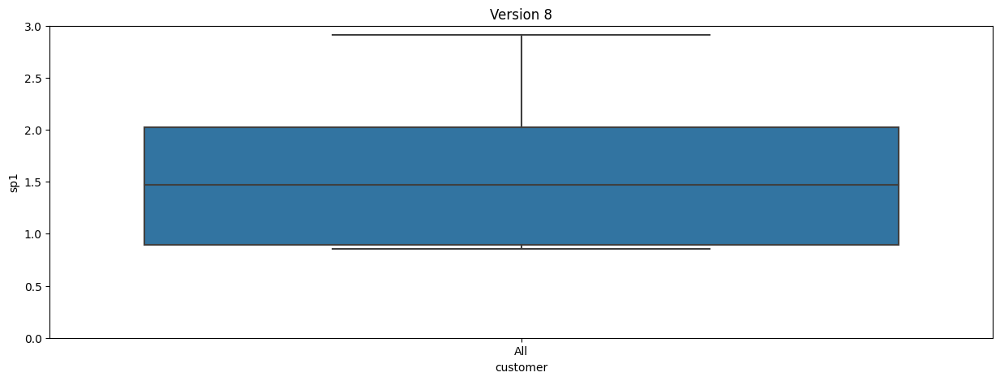

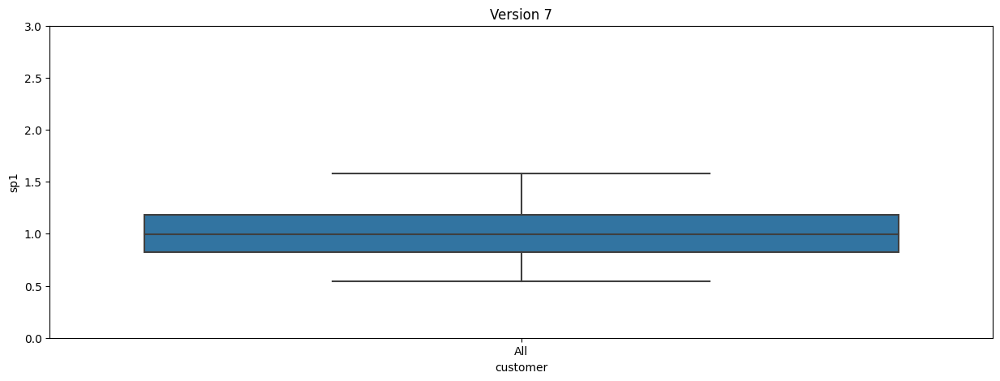

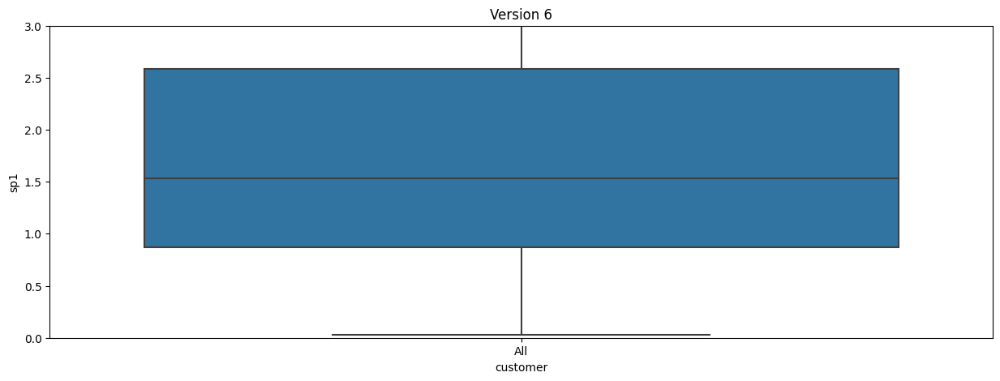

In [71]:
for i in range(len(versions)): 
    this_results = results[results['version'] == versions[i]]
    plt.figure(figsize=(15,5))
    plt.ylim(0,3)
    sns.boxplot(data=this_results, y="sp1", x="customer")
    plt.title("Version {}".format(versions[i]))
    plt.show()


## Permutation importance

In [72]:
from sklearn.inspection import permutation_importance

Version 8
(321, 61) (293, 61) (28, 61)


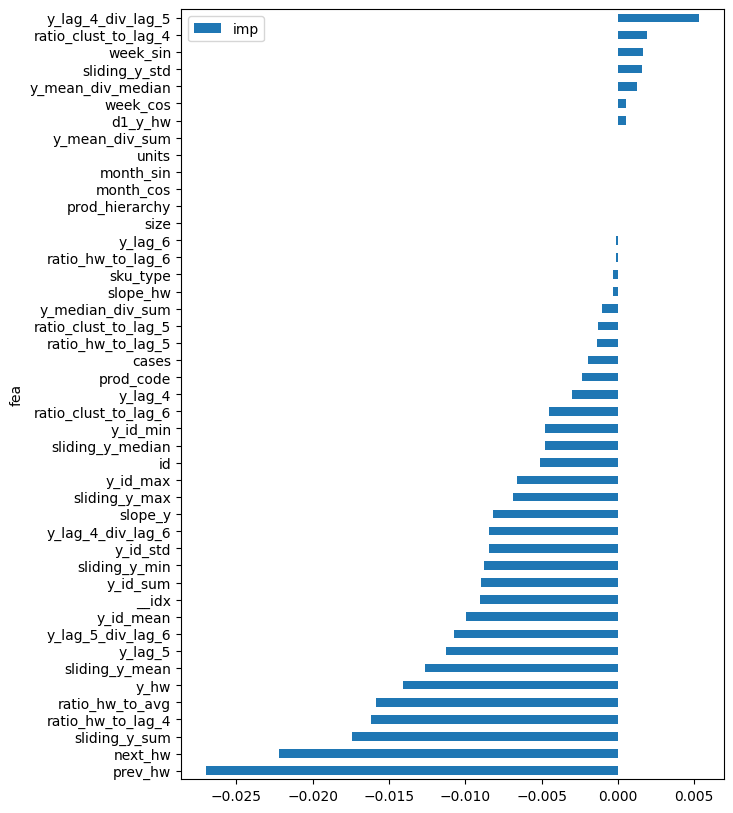

Version 7
(293, 61) (265, 61) (28, 61)


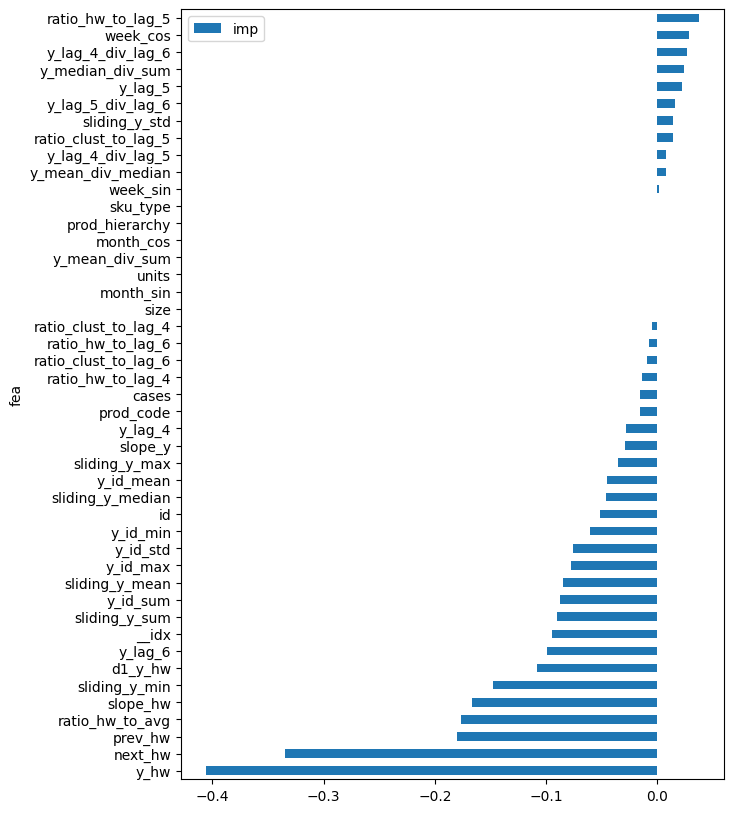

Version 6
(265, 61) (237, 61) (28, 61)


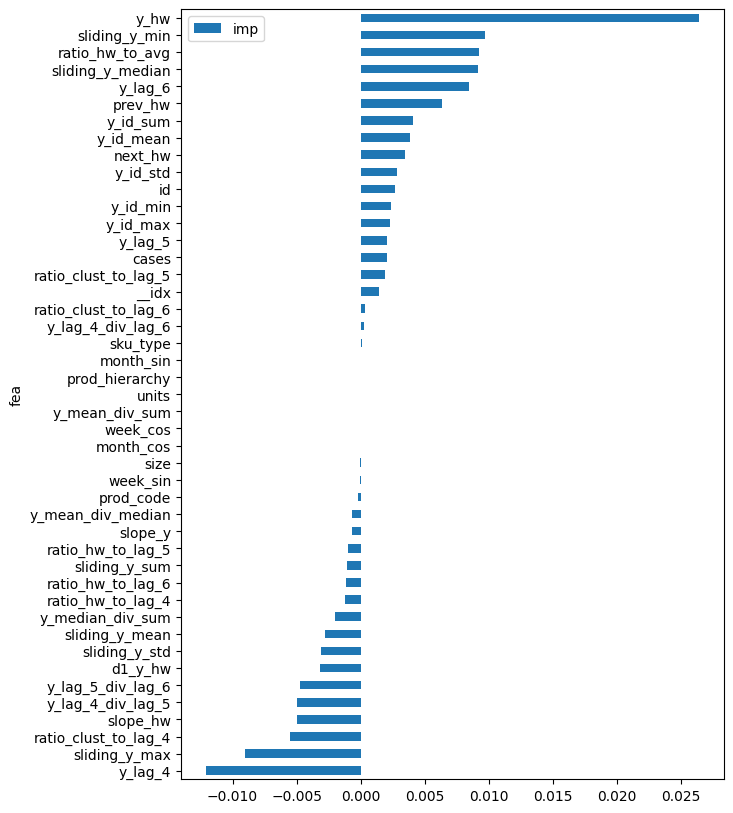

In [73]:
models_all = {}
fea_imps_all = {}
for this_version in range(len(versions)):
    print("Version {}".format(versions[this_version]))
    this_df = df[df['ts'] < np.min(all_dates[versions[this_version]]['forecast'])]
    pred_hw = pred_hws[versions[this_version]]
    y_sliding = y_sliding_all[versions[this_version]]
    cluster_features_actual = cluster_features_actual_all[versions[this_version]]
    cluster_features = cluster_features_all[versions[this_version]]
    
    models = {}
    drop_cols = []
    fea_imps = {}

    train, test, x_train, x_test, y_train, y_test = process_data(
        df.loc[~df.id.isin([2])].drop(columns=["sku_desc", "description"]), all_dates[versions[this_version]],
        pred_hw, y_sliding[sliding_param], cluster_features_actual, cluster_features,
    )

    x_train.drop(columns=drop_cols, inplace=True)
    x_test.drop(columns=drop_cols, inplace=True)

    x_train.dropna(axis=1, inplace=True)
    x_test = x_test[x_train.columns]

    # x_train.fillna(0, inplace=True)
    # x_test.fillna(0, inplace=True)

    cols = x_train.select_dtypes(exclude=np.number).columns.tolist() + ["sku", "prod_code", "cases", "size"]
    encoders = {}
    for c in cols:
        if c not in x_train.columns:
            continue
        if c == "id":
            continue
        enc = LabelEncoder()
        if "event" in c:
            enc.fit(pd.concat([x_train[c], x_test[c]]))
            x_train[c] = enc.transform(x_train[c])
            x_test[c] = enc.transform(x_test[c])
        else:
            x_train[c] = enc.fit_transform(x_train[c])
            x_test[c] = enc.transform(x_test[c])
        encoders.update({c: enc})

    model = RandomForestRegressor(
        n_estimators=500,
        max_features="sqrt",
        n_jobs=-1,
        random_state=42
    )
    model.fit(x_train, y_train)

    r = permutation_importance(
        model, 
    #     x_train, y_train,
        x_test, y_test,
        n_repeats=30,
        random_state=123,
    )

    fea_imps = pd.DataFrame({
        "imp": r.importances_mean, 
        "fea": x_train.columns
    })
    fea_imps.sort_values(by="imp", ascending=True, inplace=True)
    fea_imps.set_index("fea", inplace=True)
    fea_imps.tail(50).plot.barh(figsize=(7,10))
    plt.show()
    fea_imps_all.update({versions[this_version]: fea_imps})


In [74]:
fea_imps_all[8].to_csv("fea_imp_rf.csv")

## Refit without negatives

In [75]:
models_all = {}
for this_version in range(len(versions)):
    fea_imps = fea_imps_all[versions[this_version]]
    thres = np.quantile(fea_imps.imp, 0.1)
    thres = 0
    print(thres)
    fea_imps.loc[fea_imps.imp < thres].shape, fea_imps.loc[fea_imps.imp >= thres].shape
    drop_cols = fea_imps.loc[(fea_imps.imp < thres)].index.values
    print(drop_cols)
    print("Version {}".format(versions[this_version]))
    this_df = df[df['ts'] < np.min(all_dates[versions[this_version]]['forecast'])]
    pred_hw = pred_hws[versions[this_version]]
    y_sliding = y_sliding_all[versions[this_version]]
    cluster_features_actual = cluster_features_actual_all[versions[this_version]]
    cluster_features = cluster_features_all[versions[this_version]]
    
    models = {}

    train, test, x_train, x_test, y_train, y_test = process_data(
        df.loc[~df.id.isin([2])].drop(columns=["sku_desc", "description"]), all_dates[versions[this_version]],
        pred_hw, y_sliding[sliding_param], cluster_features_actual, cluster_features,
    )

    x_train.drop(columns=drop_cols, inplace=True)
    x_test.drop(columns=drop_cols, inplace=True)

    x_train.dropna(axis=1, inplace=True)
    x_test = x_test[x_train.columns]

    # x_train.fillna(0, inplace=True)
    # x_test.fillna(0, inplace=True)

    cols = x_train.select_dtypes(exclude=np.number).columns.tolist() + ["sku", "prod_code", "cases", "size"]
    encoders = {}
    for c in cols:
        if c not in x_train.columns:
            continue
        if c == "id":
            continue
        enc = LabelEncoder()
        if "event" in c:
            enc.fit(pd.concat([x_train[c], x_test[c]]))
            x_train[c] = enc.transform(x_train[c])
            x_test[c] = enc.transform(x_test[c])
        else:
            x_train[c] = enc.fit_transform(x_train[c])
            x_test[c] = enc.transform(x_test[c])
        encoders.update({c: enc})

    model = RandomForestRegressor(
        n_estimators=500,
        max_features="sqrt",
        n_jobs=-1,
        random_state=42
    )
    model.fit(x_train, y_train)

    yhat_train = model.predict(x_train)
    yhat_test = model.predict(x_test)

    yhat_train = np.clip(yhat_train, 0, None)
    yhat_test = np.clip(yhat_test, 0, None)

    models = {
        "model": model,
        "train": train,
        "test": test,
        "x_train": x_train,
        "x_test": x_test,
        "y_train": y_train,
        "y_test": y_test,
        "yhat_train": yhat_train,
        "yhat_test": yhat_test,
    }
    models_all.update({versions[this_version]: models})

0
['prev_hw' 'next_hw' 'sliding_y_sum' 'ratio_hw_to_lag_4' 'ratio_hw_to_avg'
 'y_hw' 'sliding_y_mean' 'y_lag_5' 'y_lag_5_div_lag_6' 'y_id_mean' '__idx'
 'y_id_sum' 'sliding_y_min' 'y_id_std' 'y_lag_4_div_lag_6' 'slope_y'
 'sliding_y_max' 'y_id_max' 'id' 'sliding_y_median' 'y_id_min'
 'ratio_clust_to_lag_6' 'y_lag_4' 'prod_code' 'cases' 'ratio_hw_to_lag_5'
 'ratio_clust_to_lag_5' 'y_median_div_sum' 'slope_hw' 'sku_type'
 'ratio_hw_to_lag_6' 'y_lag_6' 'size']
Version 8
(321, 61) (293, 61) (28, 61)
0
['y_hw' 'next_hw' 'prev_hw' 'ratio_hw_to_avg' 'slope_hw' 'sliding_y_min'
 'd1_y_hw' 'y_lag_6' '__idx' 'sliding_y_sum' 'y_id_sum' 'sliding_y_mean'
 'y_id_max' 'y_id_std' 'y_id_min' 'id' 'sliding_y_median' 'y_id_mean'
 'sliding_y_max' 'slope_y' 'y_lag_4' 'prod_code' 'cases'
 'ratio_hw_to_lag_4' 'ratio_clust_to_lag_6' 'ratio_hw_to_lag_6'
 'ratio_clust_to_lag_4' 'size']
Version 7
(293, 61) (265, 61) (28, 61)
0
['y_lag_4' 'sliding_y_max' 'ratio_clust_to_lag_4' 'slope_hw'
 'y_lag_4_div_lag_5' 'y_la

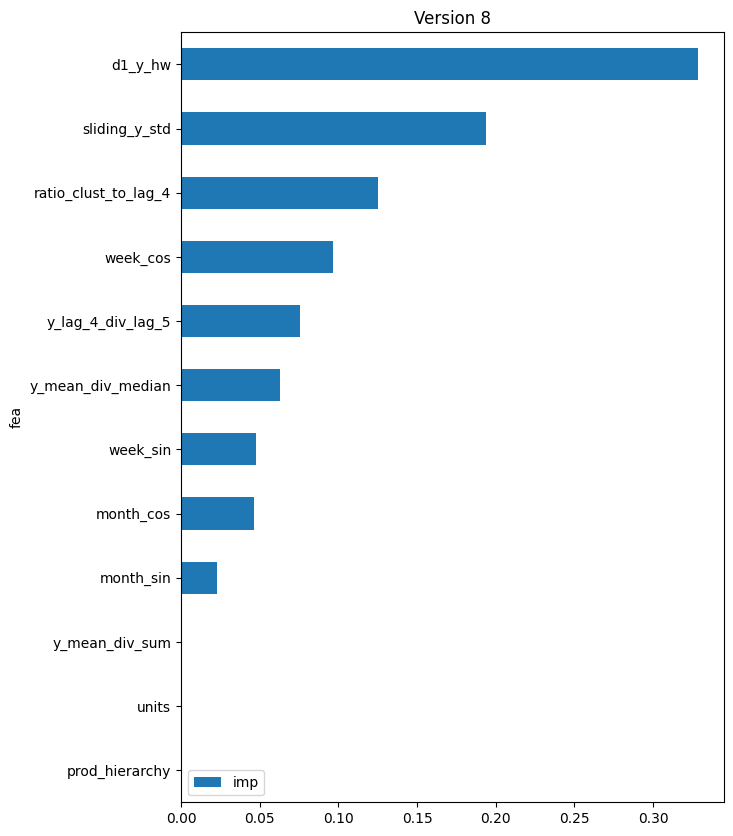

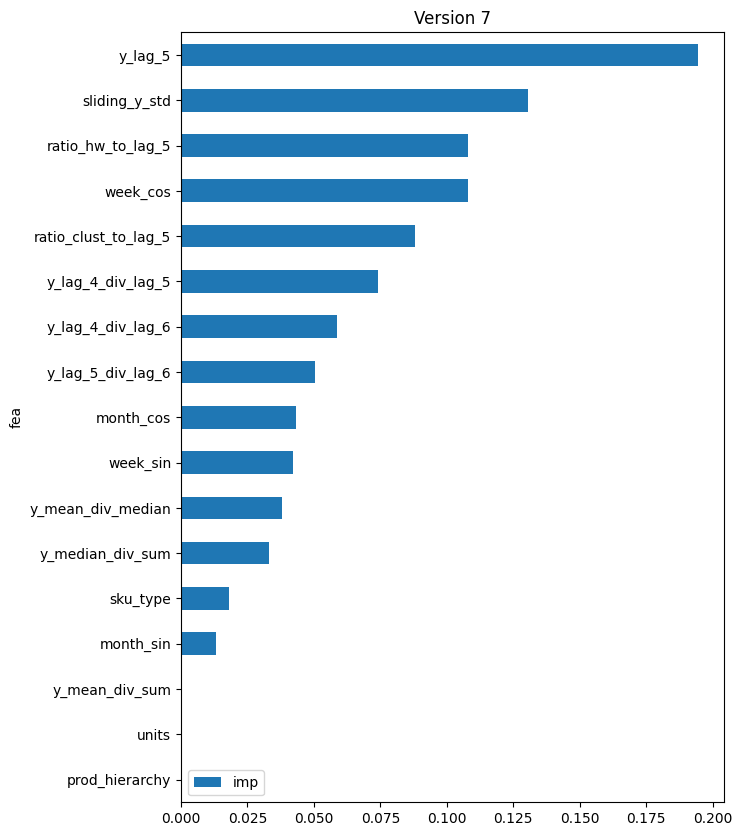

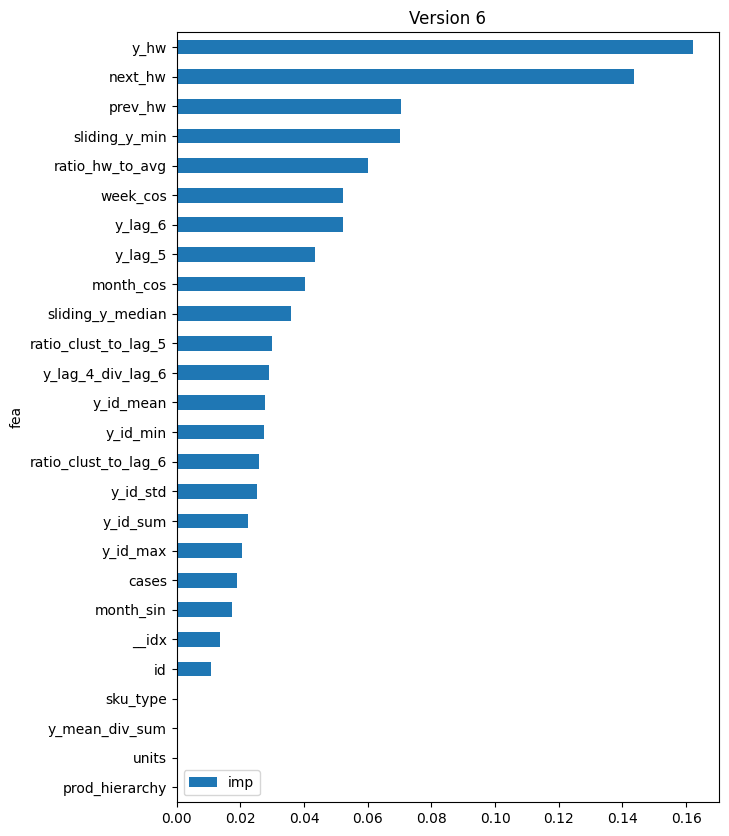

In [76]:


#models_all = {}
for this_version in range(len(versions)):
    models = models_all[versions[this_version]]
    k = models["model"]
    x_train = models["x_train"]

    x_train.dropna(axis=1, inplace=True)

    fea_imp = pd.DataFrame({
        "imp": k.feature_importances_, 
        "fea": x_train.columns
    })
    fea_imp.sort_values(by="imp", ascending=True, inplace=True)
    fea_imp.set_index("fea", inplace=True)
    fea_imp.tail(30).plot.barh(figsize=(7,10))
    plt.title("Version {}".format(versions[this_version]))
    plt.show()        

In [77]:
rf_yhat = []
for this_version in range(len(versions)):
    models = models_all[versions[this_version]]
    aaa = models["train"].copy()
    aaa["yhat"] = models["yhat_train"]
    aaa['version'] = versions[this_version]
    this_rf_yhat = [aaa]

    aaa = models["test"].copy()
    aaa["yhat"] = models["yhat_test"]
    this_rf_yhat.append(aaa)
    this_rf_yhat = pd.concat(this_rf_yhat).reset_index(drop=True)
    this_rf_yhat['version'] = versions[this_version]
    rf_yhat.append(this_rf_yhat)

rf_yhat = pd.concat(rf_yhat).reset_index(drop=True)

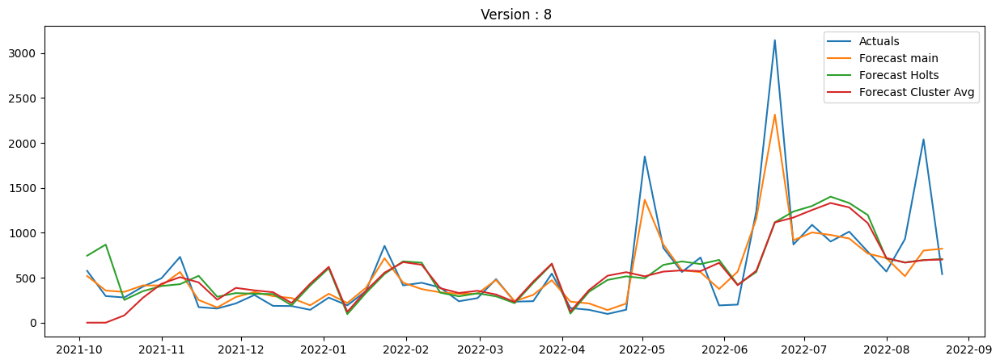

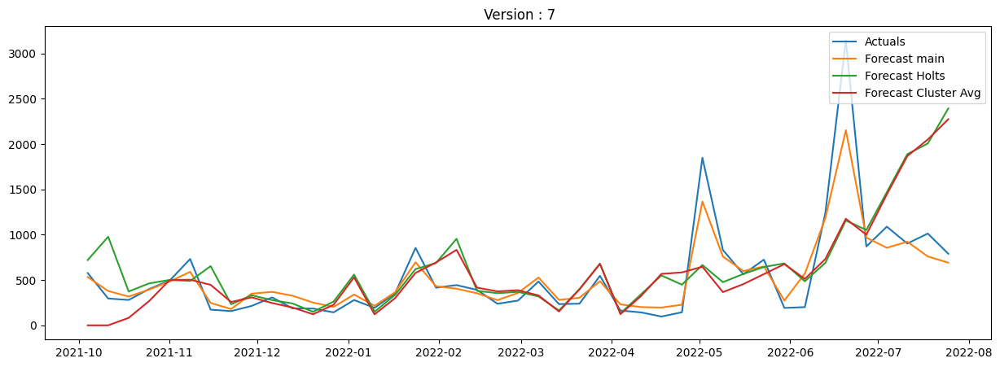

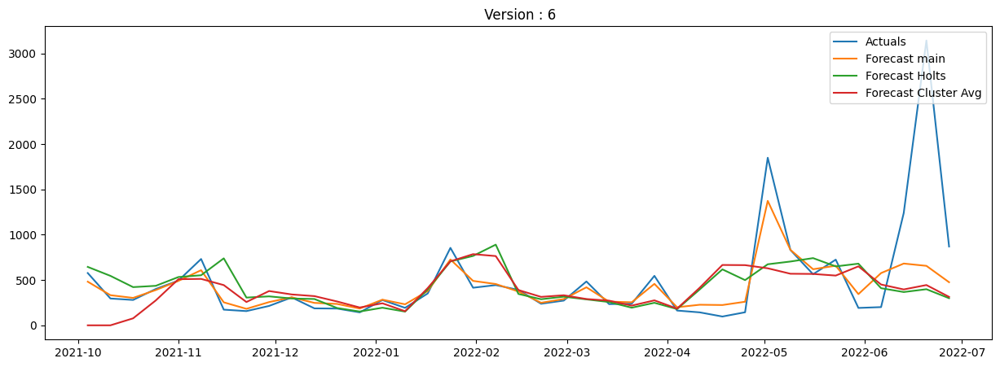

In [78]:
for this_version in range(len(versions)):
    this_rf_yhat = rf_yhat[rf_yhat['version'] == versions[this_version]]
    ts = this_rf_yhat.groupby("ts").sum()
    plt.figure(figsize=(15,5))
    plt.plot(ts.y, label="Actuals")
    plt.plot(ts.yhat, label="Forecast main")
    plt.plot(ts.y_hw, label="Forecast Holts")
    plt.plot(ts.y_clust_avg, label="Forecast Cluster Avg")
    plt.title(" Version : {}".format(versions[this_version] ))
    plt.legend(loc = "upper right")
    plt.show()

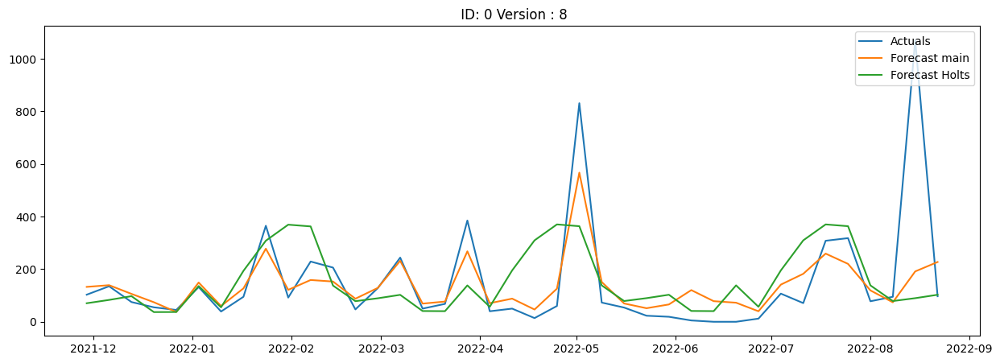

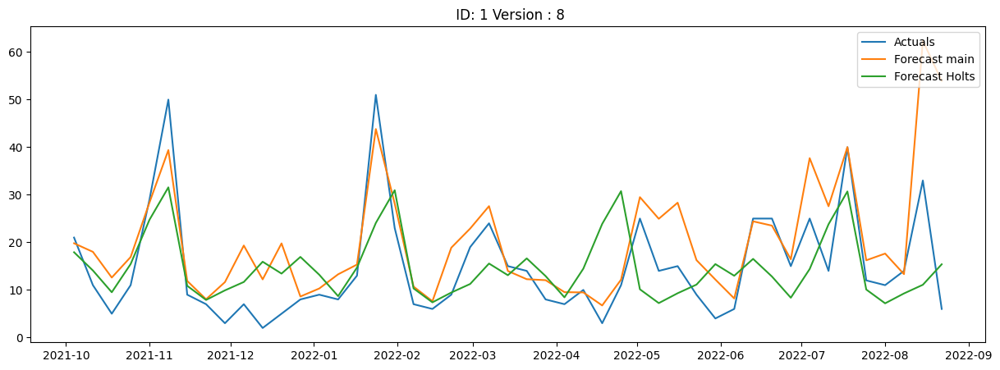

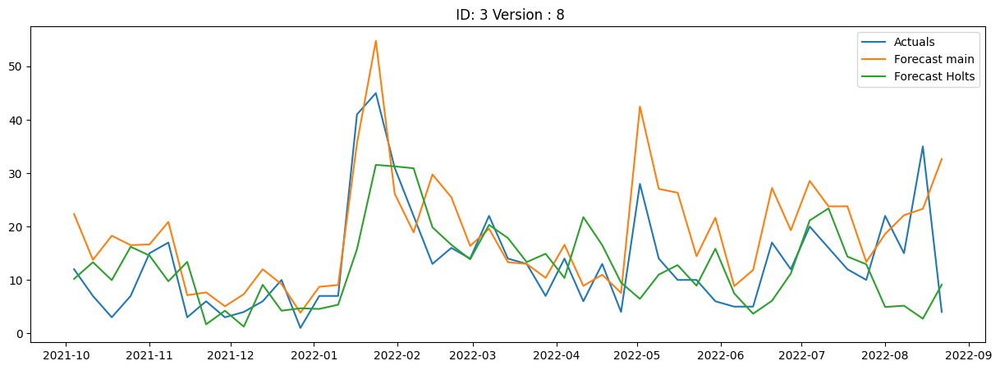

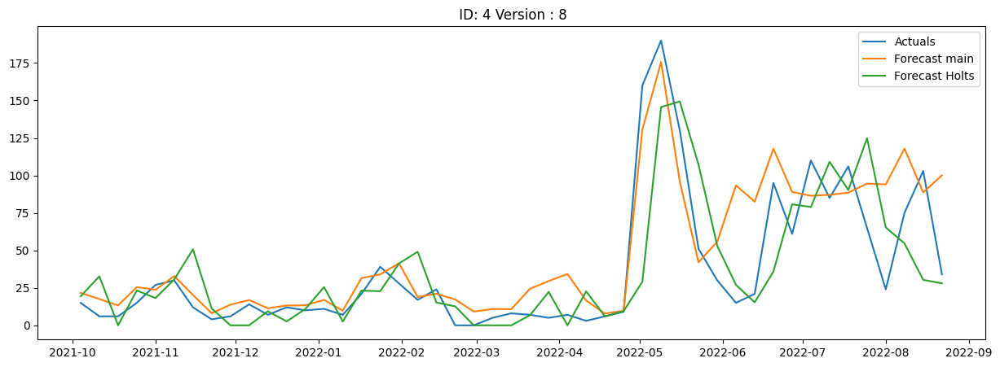

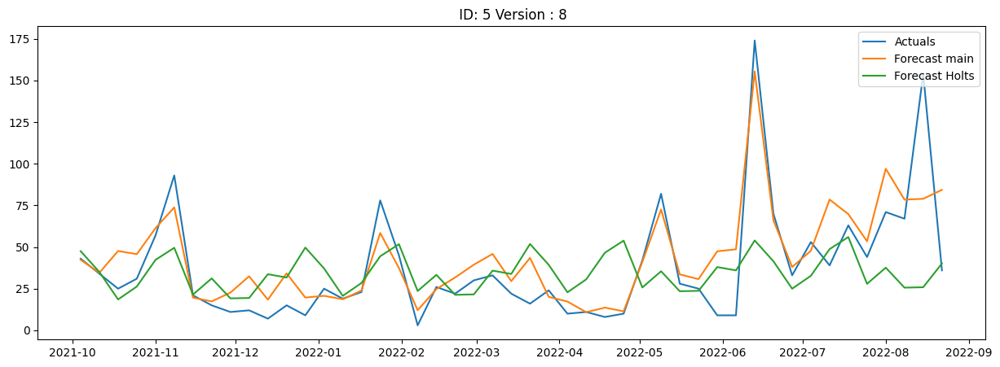

...

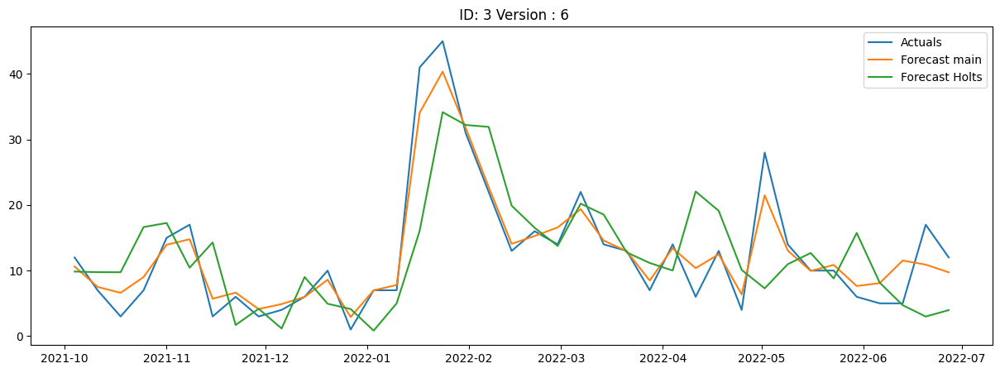

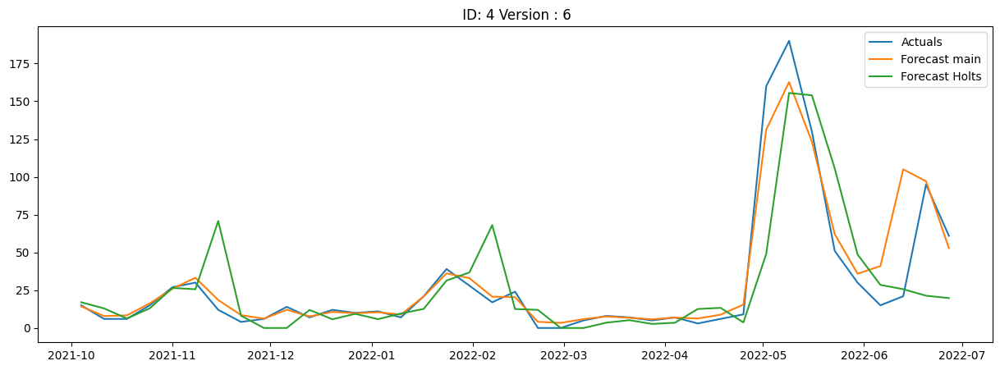

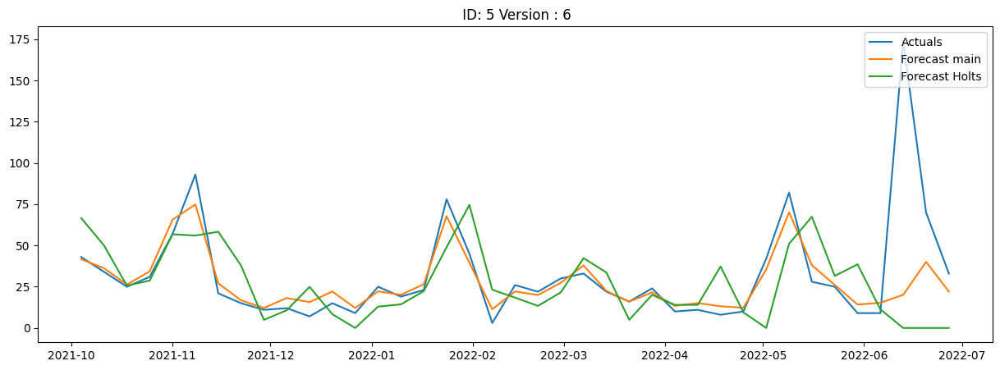

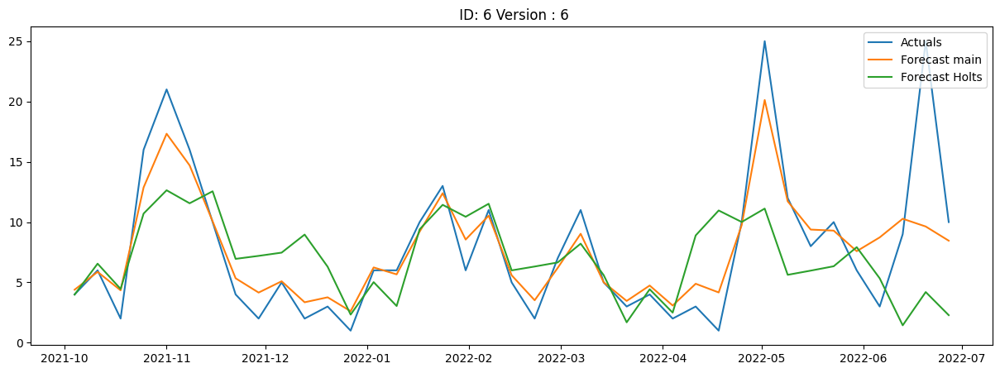

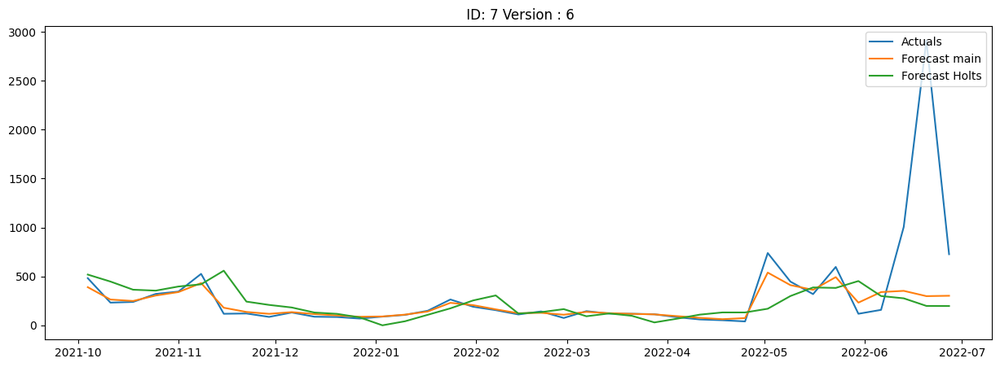

In [79]:
for this_version in range(len(versions)):
    for c in rf_yhat.id.unique():
        ts = rf_yhat.loc[ (rf_yhat.id == c) & (rf_yhat.version == versions[this_version])].groupby("ts").sum()
        plt.figure(figsize=(15,5))
        plt.plot(ts.y, label="Actuals")
        plt.plot(ts.yhat, label="Forecast main")
        plt.plot(ts.y_hw, label="Forecast Holts")
        plt.legend(loc = "upper right")
        plt.title(" ID: {} Version : {}".format(c,versions[this_version] ))
        plt.show()

### Results

In [80]:
results = pd.DataFrame()
for i in range(len(versions)):
    this_ts = rf_yhat[rf_yhat["version"] == versions[i]]
    for _id in this_ts.id.unique():
        ts = this_ts.loc[(this_ts["id"] == _id)].reset_index(drop=True)
        test = ts.loc[ ts.ts.isin( all_dates[versions[i]]["test"]) ].copy()
        
        metrics = calc_metrics(test.y, test.yhat)
        metrics.update({
            "id": _id,
            "version" : versions[i],
            "sku": ts["sku"][0],
            "test_start": all_dates[versions[i]]["test"][0],
            "test_end": all_dates[versions[i]]["test"][-1],
            "total_actual": test.y.sum(),
            "total_forecast": test.yhat.sum(),
        })
        results = results.append(metrics, ignore_index=True, sort=False)

main_cols = ["id", "sku", "version", "test_start", "test_end", "total_actual", "total_forecast"]
results = results[main_cols + list(results.drop(columns=main_cols).columns)].copy()
results["sp1"] = results["total_actual"] / results["total_forecast"]
results["sp1"] = np.nan_to_num(results["sp1"], nan=1, posinf=0, neginf=0)


results.sort_values(by="id").reset_index(drop=True).set_index(["version", "id"])
results.groupby("id").mean()
results.groupby("id").median()
results['customer'] = 'All'
results

/tmp/ipykernel_393445/2714935387.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append(metrics, ignore_index=True, sort=False)
/tmp/ipykernel_393445/2714935387.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append(metrics, ignore_index=True, sort=False)
/tmp/ipykernel_393445/2714935387.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append(metrics, ignore_index=True, sort=False)
/tmp/ipykernel_393445/2714935387.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results = results.append(metrics, ignore_index=True, sort=False)
/tmp/ipykernel_393445/2714935387.py:18: 

,id,sku,version,test_start,test_end,total_actual,total_forecast,rmse,mae,smape,mape,maape,sp1,customer
0,0,80692947,8,2022-08-01,2022-08-22,1341.0,611.956,445.171809,267.9800,0.715564,0.728112,0.580280,2.191334,All
1,1,80702886,8,2022-08-01,2022-08-22,64.0,147.250,28.303311,21.1545,0.682271,2.382866,0.691311,0.434635,All
2,3,82332207,8,2022-08-01,2022-08-22,76.0,96.710,15.963824,12.7065,0.628449,2.031173,0.587383,0.785855,All
3,4,82332208,8,2022-08-01,2022-08-22,236.0,400.560,53.155550,48.3080,0.691466,1.392284,0.748348,0.589175,All
4,5,82332219,8,2022-08-01,2022-08-22,328.0,338.782,46.840349,40.2135,0.478706,0.591905,0.476173,0.968174,All
5,6,82332800,8,2022-08-01,2022-08-22,38.0,85.782,15.572782,13.2475,0.986793,4.301490,0.966077,0.442983,All
6,7,82332932,8,2022-08-01,2022-08-22,1997.0,1179.964,272.815339,204.2590,0.471748,0.339377,0.309456,1.692425,All
7,0,80692947,7,2022-07-04,2022-07-25,804.0,482.094,151.462355,128.2545,0.718246,0.616307,0.548187,1.667725,All
8,1,80702886,7,2022-07-04,2022-07-25,91.0,249.258,57.588601,46.5625,0.958514,2.689467,0.957221,0.365084,All
9,3,82332207,7,2022-07-04,2022-07-25,58.0,171.204,33.520955,28.3010,0.881870,1.762621,0.975758,0.338777,All


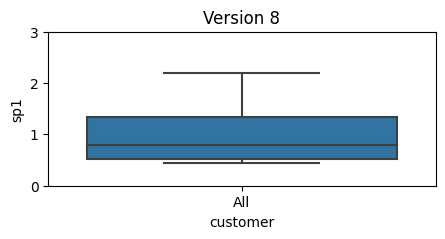

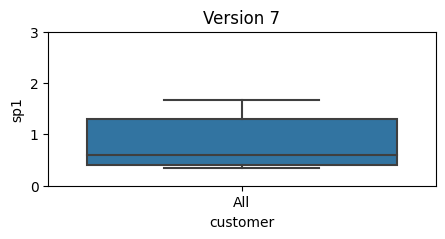

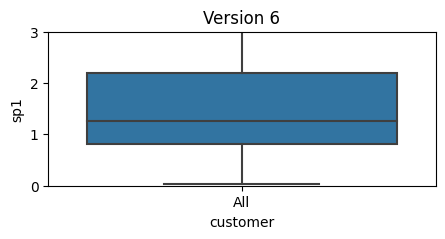

In [81]:
for i in range(len(versions)): 
    this_results = results[results['version'] == versions[i]]
    plt.figure(figsize=(5,2))
    plt.ylim(0,3)
    sns.boxplot(data=this_results, y="sp1", x="customer")
    plt.title("Version {}".format(versions[i]))
    plt.show()

    